In [16]:
# import needed libraries
import numpy as np
import os
import matplotlib.pyplot as plt
from google.colab import drive
import matplotlib.image as mpimg
from IPython import display
import cv2
from pathlib import Path
import sys
import tensorflow as tf
from PIL import Image
from PIL import ImageChops
import cv2
from google.colab.patches import cv2_imshow
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def load_images(image_path, folder_name): # load all images of the input folder in list icludes pathes of these images
  if (folder_name == "Train"):
    image_files = sorted([os.path.join(image_path, 'Train', file)
                          for file in os.listdir(image_path + "/Train")])
  elif (folder_name == "Validate"):
    image_files = sorted([os.path.join(image_path, 'Validate', file)
                          for file in os.listdir(image_path + "/Validate")])
  else :
    image_files = sorted([os.path.join(image_path, 'Test', file)
                          for file in os.listdir(image_path + "/Test")])
   
  images = []
  for i in range(len(image_files)):
    img = cv2.imread(image_files[i])
    images.append(img)
  images = np.array(images)
  images = images.astype(np.float32)
  
  return images, image_files

In [ ]:
def load_labels(path):
  labels_files = sorted(os.listdir(path))
  labels = []
  for i in range(len(labels_files)):
    f = path + '/'+ labels_files[i]
    with open(f,  encoding='windows-1256') as file:
      text = file.read()
      labels.append(text)
    file.close()
  labels = np.array(labels)
  return labels

In [ ]:
def crop(image):
    # Obtain binary image. Load the image, convert to grayscale, apply a large Gaussian blur, and then Otsu's threshold
    original = image.copy()
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # to make the input image gray
    blur = cv2.GaussianBlur(gray, (25,25), 0) # change the kernel size to (25,25)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1] # this is used to convert the grayscale image into white&black image

    # Perform morph operations, first open to remove noise, then close to combine
    noise_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3)) # Returns a structuring element of the specified size and shape for morphological operations
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, noise_kernel, iterations=2) # this is used in removing noise.
    close_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
    close = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, close_kernel, iterations=3) # Closing is reverse of Opening. It is useful in closing small holes inside the foreground objects, or small black points on the object.

    # Find enclosing boundingbox and crop ROI
    coords = cv2.findNonZero(close) # returns the list of locations of non-zero pixels
    x,y,w,h = cv2.boundingRect(coords) # returns the parameters of rect that includes the text of image
    cv2.rectangle(image, (x, y), (x + w, y + h), (36,255,12), 2) # function of OpenCV is used to draw an approximate rectangle around the binary image. This function is used mainly to highlight the region of interest after obtaining contours from an image.
    crop = original[y:y+h, x:x+w] # crop the original image with the drawn rect around the text of image
    return crop

In [ ]:
def deskew(image):

  # convert the image to grayscale and flip the foreground
  # and background to ensure foreground is now "white" and
  # the background is "black"
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  gray = cv2.bitwise_not(gray)

  # threshold the image, setting all foreground pixels to
  # 255 and all background pixels to 0
  thresh = cv2.threshold(gray, 0, 255,
    cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]

  # grab the (x, y) coordinates of all pixel values that
  # are greater than zero, then use these coordinates to
  # compute a rotated bounding box that contains all
  # coordinates
  coords = np.column_stack(np.where(thresh > 0))
  angle = cv2.minAreaRect(coords)[-1]

  # the `cv2.minAreaRect` function returns values in the
  # range [-90, 0); as the rectangle rotates clockwise the
  # returned angle trends to 0 -- in this special case we
  # need to add 90 degrees to the angle
  if angle < -45:
    angle = -(90 + angle)

  # otherwise, just take the inverse of the angle to make
  # it positive
  else:
    angle = -angle

  # rotate the image to deskew it
  (h, w) = image.shape[:2]
  center = (w // 2, h // 2)
  M = cv2.getRotationMatrix2D(center, angle, 1.0)
  rotated = cv2.warpAffine(image, M, (w, h),
  flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

  return rotated

In [ ]:
def preprocess_Hight(I):
  #width= I.shape[1]
  #rate = width / I.shape[0]
  #width = int(rate * 48) # change the width to be with the same rate with height as original image
  new_dim = (800, 64)
  image_PreProcess_Hight = cv2.resize(I, new_dim, interpolation = cv2.INTER_AREA) # resize the image with the new height and width
  return image_PreProcess_Hight

In [ ]:
def preprocess_images(images, list_images, folder_name):
  processed_images = []
  for i in range(len(images)):
    img = images[i]
    crop_image = crop(img)
    rotated = deskew(crop_image)
    rotated = crop(rotated)
    change_height = preprocess_Hight(rotated)
    #cv2_imshow(change_height)
    #print(change_height.shape)
    cv2.imwrite('/content/drive/My Drive/' + folder_name + '/'+ Path(list_images[i]).stem +'.png', change_height) 
    processed_images.append(change_height)
  processed_images = np.array(processed_images)
  return processed_images

In [ ]:
#Load images
train_images =load_images("/content/drive/My Drive/UniqueImages", "Train")
valid_images =load_images("/content/drive/My Drive/UniqueImages", "Validate")
test_images =load_images("/content/drive/My Drive/UniqueImages", "Test")

In [ ]:
#load labels
train_labels = load_labels("/content/drive/My Drive/UniqueTextUnicodeTruthValues-v1.0/Training")
valid_labels = load_labels("/content/drive/My Drive/UniqueTextUnicodeTruthValues-v1.0/Validation")
test_labels = load_labels("/content/drive/My Drive/UniqueTextUnicodeTruthValues-v1.0/Testing")

In [ ]:
#Train folder
for i in range(len(train_images)):
  cv2_imshow(train_images[i])
  print(train_labels[i])

Output hidden; open in https://colab.research.google.com to view.

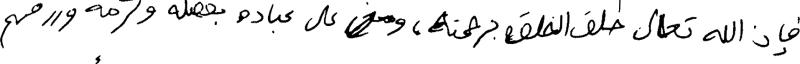

فإن الله تعالى خلق الخلق برحمته، ومن على عباده بفضله وكرمه ورزقهم


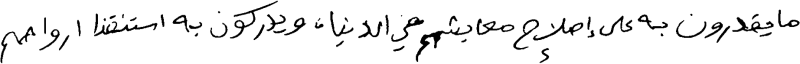

ما يقدرون به على إصلاح معايشهم في الدنيا، ويدركون به استنقذا أرواحهم


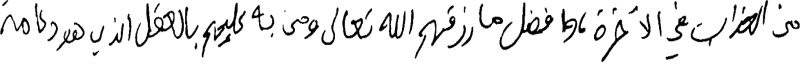

من العذاب في الآخرة، وأفضل ما رزقهم الله تعالى ومن به عليهم بالعقل الذي هو دعامة


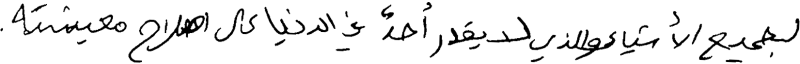

لجميع الأشياء والذي لا يقدر أحدٌ في الدنيا على إصلاح معيشته .


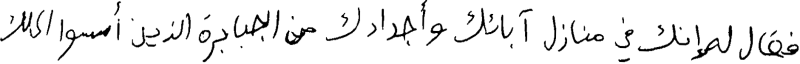

فقال له  إنك في منازل آبائك وأجدادك من الجبابرة الذين أسسوا الملك


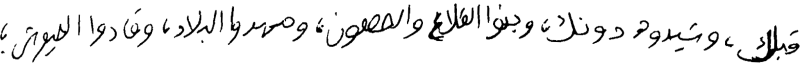

قبلك، وشيدوه دونك، وبنوا القلاع والحصون، ومهدوا البلاد، وقادوا الجيوش ;


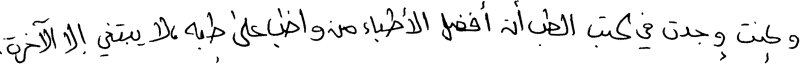

وكنت وجدت في كتب الطب أن أفضل الأطباء من واظب على طبه، لا يبتغي إلا الآخرة.


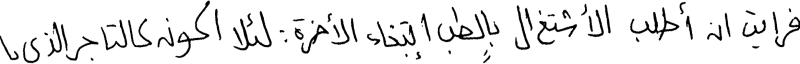

  فرأيت أن أطلب الأشتغ ال بالطب إبتغاء الأخرة: لئلا أكون كالتاجر الذي باع


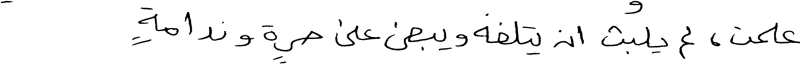

علمت ، لم يلبث ان يتلفه ويبقى على حرةٍ وندامةٍ


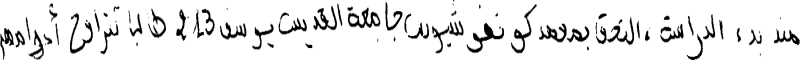

منذ بدء الدراسة ، التحق بمعهد كونفوشيوس جامعة القديس يوسف 213 طالبا تتراوح أعوامهم


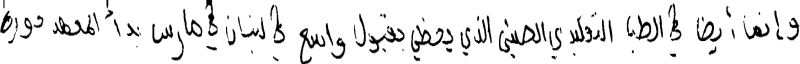

وإنما أيضا في الطب التقليدي الصيني الذي يحظى بقبول واسع في لبنان في مارس  بدأ المعهد دورة


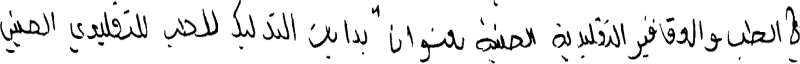

في الطب والعقاقير التقليدية الصينية بعنوان "بدايات التدليك للطب التقليدي الصيني


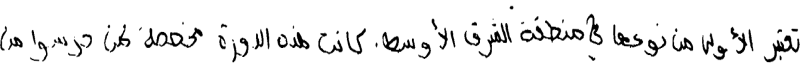

تعتبر الأولى من نوعها في منطقة الشرق الأوسط. كانت هذه الدورة مخصصة لمن درسوا من


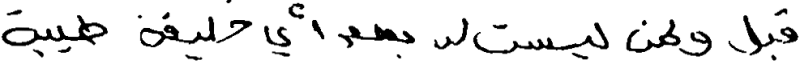

 قبل ولمن ليست لديهم أي خليقة طيبة


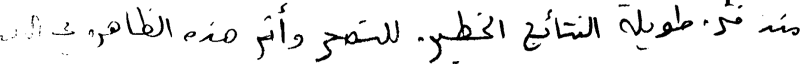

منذ  فتر . طويلة  النتائج  الخطيرة  للتصحر وأثر هذه الظاهرة في التقدم


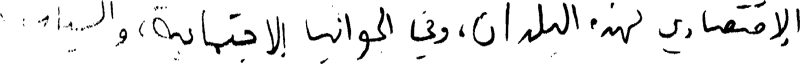

الإقتصادي  لهذه البلدان ، وفي الجوانب  إلاجتماعية، والسياسية


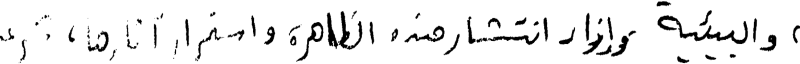

، والبيئية  .وإزاء انتشار هذه  الظاهرة  واستمرار آثارها ، شرعت


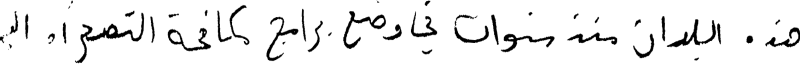

هذ . البلدان  منذ سنوات  في وضع برامج  مكافحة التصحر أو  التحات


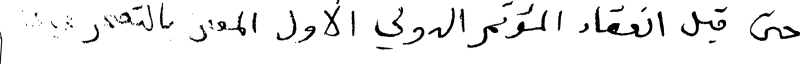

حتى  قبل انعقاد  المؤتمر الدولي  الأول  المعنى بالتصحر في عام .


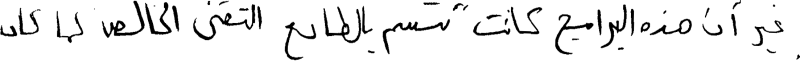

غير أن هذه البرامج كانت تتسم بالطابع  التقني الخالص كما  كان


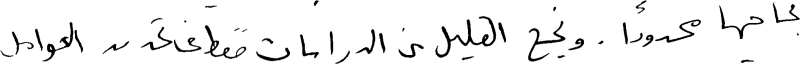

نجاحها  محدوداً . ونجح   القليل من الدراسات فقط في تحديد  العوامل


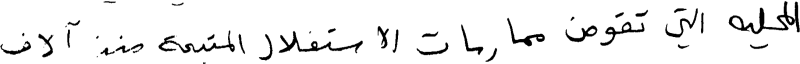

المحلية  التي  تقوض  مما رسات الاستغلال المتبعة منذ  آلاف


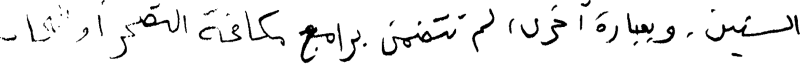

السنين . وبعبارة أخرى ، لم تتضمن برامج مكافحة التصحر أو التحات


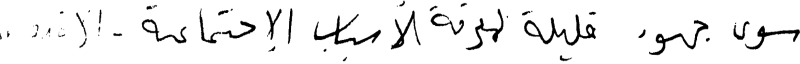

سوى  جهود   قليلة  لمعرفة الأسباب  الإجتماعية - الإقتصادية


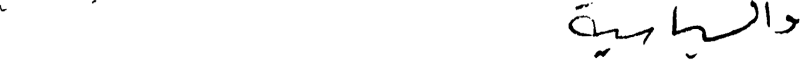

والسياسية


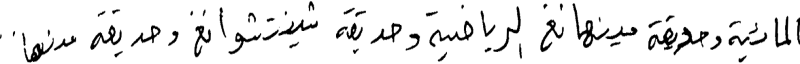

 المائية وحديقة مينهانغ الرياضية وحديقة شينتشوانغ وحديقة مينهانغ


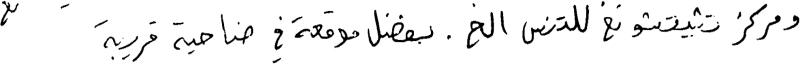

ومركز تشيتشونغ للتنس الخ.  بفضل موقعة في ضاحية قريبة


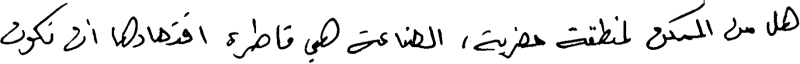

هل من الممكن لمنطقة حضرية، الصناعة هي قاطرة اقتصادها أن تكون


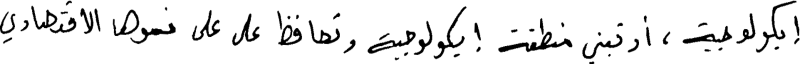

إيكولوجية، أو تبني منطقة إيكولوجية وتحافظ على على نموها الاقتصادي


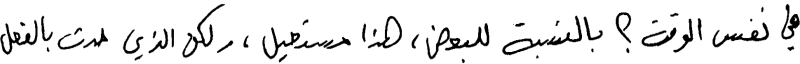

في نفس الوقت؟ بالنسبة للبعض، هذا مستحيل، ولكن الذي حدث بالفعل


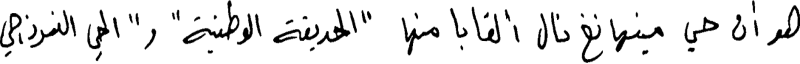

 هو أن حي مينهانغ نال ألقابا منها "الحديقة الوطنية" و"الحي النموذجي


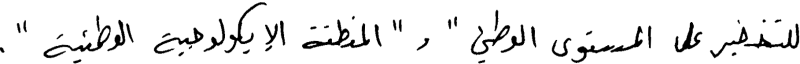

للتخضير على المستوى الوطني" و"المنطقة الإيكولوجية الوطنية".


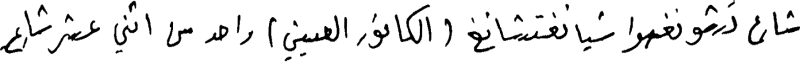

شارع تشونغهوا شيانغتشانغ (الكافور الصيني) واحد من اثني عشر شارع


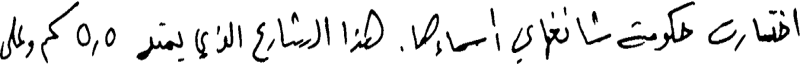

اختارت حكومة شانغهاى أسماءها.  هذا الشارع الذي يمتد 5ر5 كم وعلى


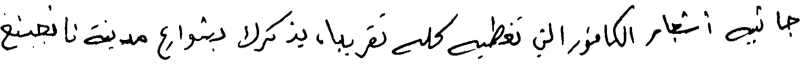

جانيه أشجار الكافور التي تغطيه كله تقريبا، يذكرك بشوارع مدينة نانجينغ


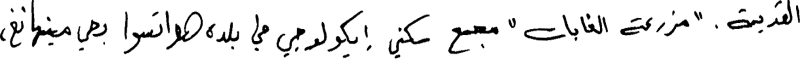

القديمة.  "مزرعة الغابات" مجمع سكني إيكولوجي في بلدة هواتسوا بحي مينهانغ،


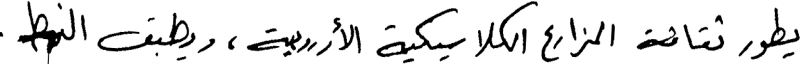

يطور ثقافة المزارع الكلاسيكية الأرروبية ، ويطبق النمط .


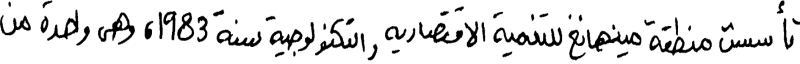

تأسست منطقة مينهانغ للتنمية الاقتصاديه والتكنولوجية سنة 1983، وهي واحدة من


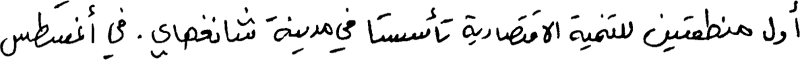

أول منطقتين للتنمية الاقتصادية تأسستا في مدينة شانغهاي.  في أغسطس


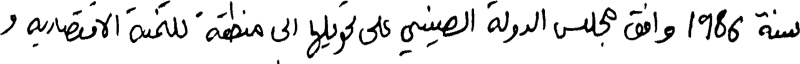

سنة 1986 وافق مجلس الدولة الصيني على تحويلها الى منطقة للتنمية الاقتصاديه و


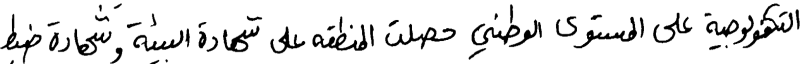

التكنولوجية على المستوى الوطني  حصلت المنطقه على شهادة البيئة وشهادة ضبط


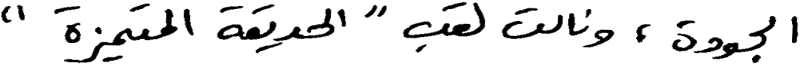

الجودة ، ونالت لقب "الحديقة المتميزة"


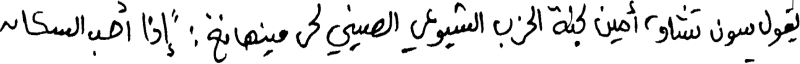

يقول سون تشاو، أمين لجنة الحزب الشيوعي الصيني لحي مينهانغ: "إذا أحب السكان


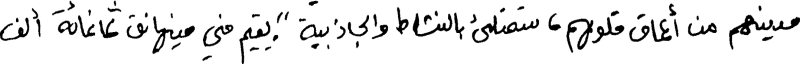

مدينتهم من أعماق قلوبهم، ستمتلئ بالنشاط والجاذبية".  يقيم في مينهانق ثمانمائة ألف


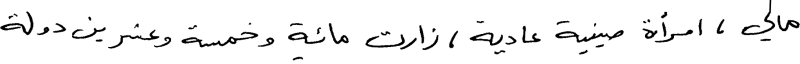

ما لي، امرأة صينية عادية ، زارت مائة وخمسة وعشرين دولة


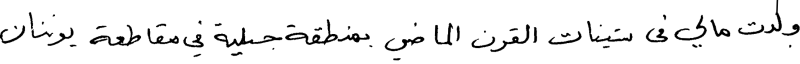

ولدت ما لي في ستينات القرن الماضي بمنطقة جبلية في مقاطعة يوننان


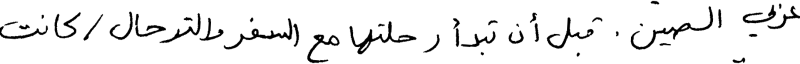

 غربي الصين . قبل أن تبدأ رحلتها مع السفر والترحال، كانت


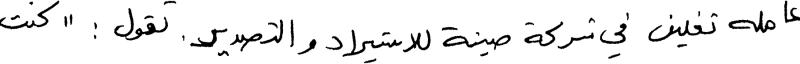

عاملة تغليف في شركة صينية للاستيراد والتصدير.  تقول: "كنت


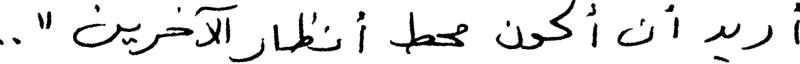

أريد أن أكون محط أنظار الآخرين" ..


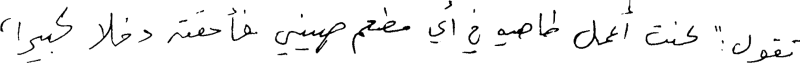

تقول: "كنت أعمل طاهيه في أي مطعم صيني فأحقق دخلا كبيرا،


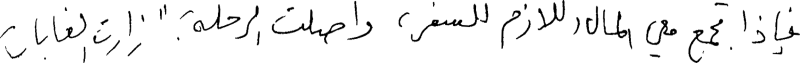

فإذا تجمع معي المال اللازم للسفر، واصلت الرحلة ". زارت الغابات


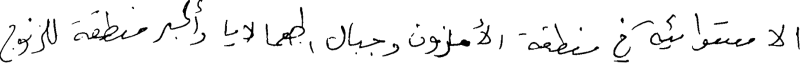

الاستوائية في منطقة  الأمازون وجبال الهمالايا وأكبر منطقة للزنوج


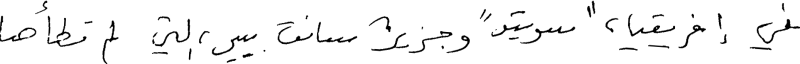

في إفريقيا، "سويتو"، وجزيرة سانت بيير  ، التي لم تطأها


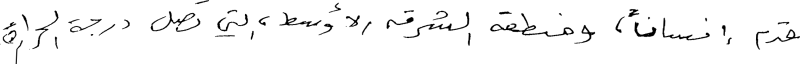

قدم إنسان، ومنطقة الشرق الأوسط، التي تصل درجة الحرارة


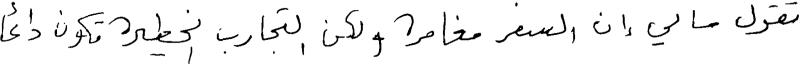

تقول ما لي إن السفر مغامرة ولكن التجارب الخطيرة تكون دائما


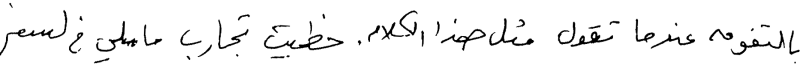

بالتفوق عندما تقول مثل هذا الكلام . حظيت تجارب ما #لي في السفر


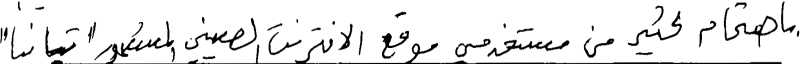

باهتمام كثير من مستخدمي موقع الإنترنت الصيني المشهور "تيانيا"


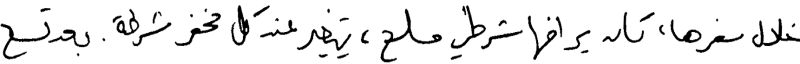

خلال سفرها، كان يرافها شرطي مسلح، يتغير عند كل مخفر شرطة.  بعد تسع


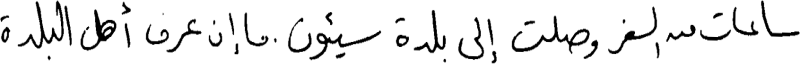

ساعات من السفر وصلت إلى بلدة سيئون . ما إن عرف أهل البلدة


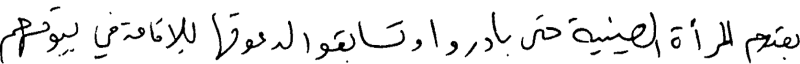

بقدوم المرأة الصينية حتى بادروا وتسابقوا لدعوتها للإقامة في بيوتهم


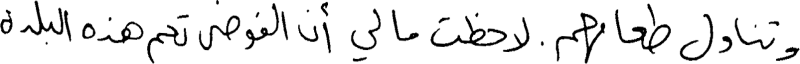

وتناول طعامهم.  لاحظت ما لي أن الفوضى تعم هذه البلدة


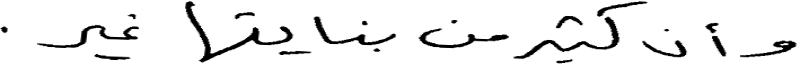

وأن كثير من بنايتها غير.


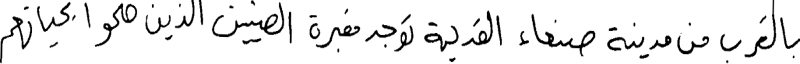

بالقرب من مدينة صنعاء القديمة توجد مقبرة الصينيين الذين ضحوا بحياتهم


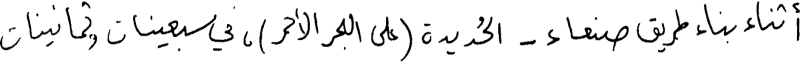

أثناء بناء طريق صنعاء- الحُديدة (على البحر الأحمر)، في سبعينات وثمانينات


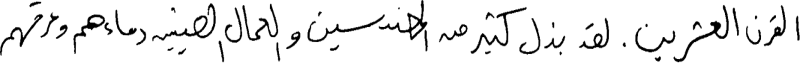

القرن العشرين . لقد بذل كثير من المهندسين والعمال الصينيين دماءهم وعرقهم


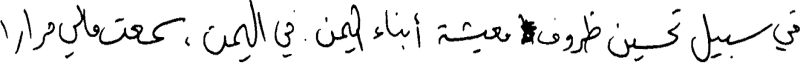

في سبيل تحسين ظروف # معيشة أبناء اليمن . في اليمن، سمعت ما لي مرارا


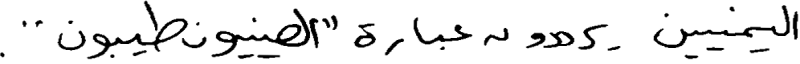

اليمنيين يرددون عبارة "الصينيون طيبون".


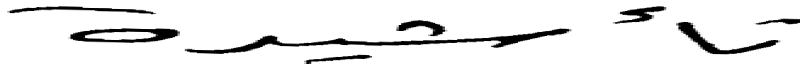

تأشيرة


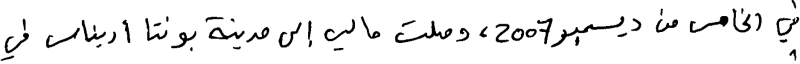

في الخامس من ديسمبر 2007، وصلت ما لي إلى مدينة بونتا أريناس في


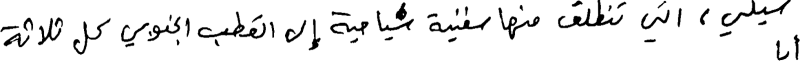

 شيلي، التي تنطلق منها سفينة سياحية إلى القطب الجنوبي كل ثلاثة


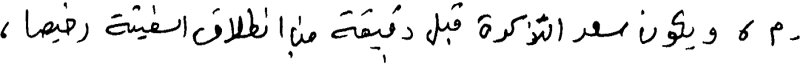

أيام، ويكون سعر التذكرة قبل دقيقة من انطلاق السفينة رخيصا،


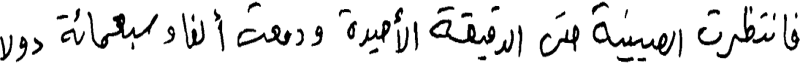

فانتظرت الصينية  حتى الدقيقة الأخيرة ودفعت ألفا وسبعمائة دولار


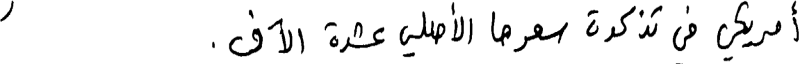

أمريكي في تذكرة سعرها الأصلي عشرة الآف .


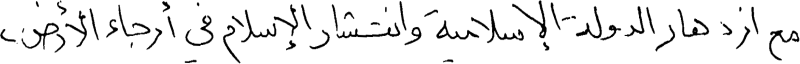

مع ازدهار الدولة الإسلامية وانتشار الإسلام في أرجاء الأرض،


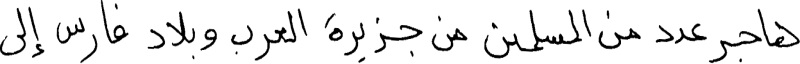

هاجر عدد من المسلمين من جزيرة العرب وبلاد فارس إلى


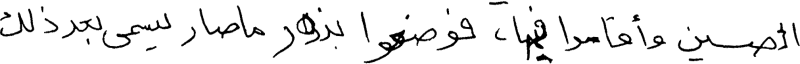

الصين وأقاموا فيها، فوضعوا بذور ما صار يسمى بعد ذلك


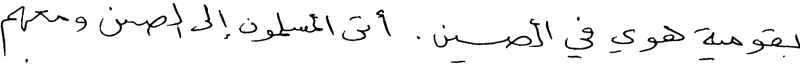

بقومية هوي في الصين . أتى المسلمون إلى الصين ومعهم


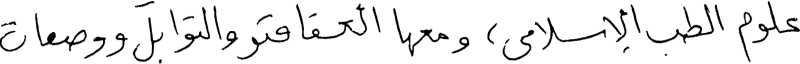

علوم الطب الإسلامي، ومعها العقاقير والتوابل ووصفات


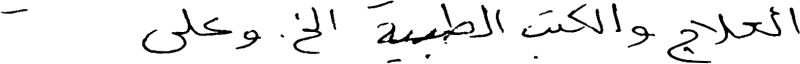

العلاج والكتب الطبية الخ  . وعلى


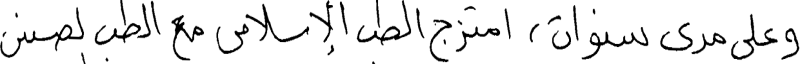

وعلى مدى سنوات، امتزج الطب الإسلامي مع الطب الصيني


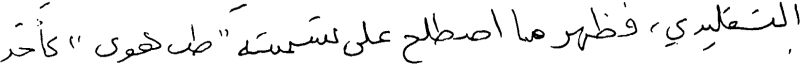

التقليدي، فظهر ما اصطلح على تسميته "طب هوي" كأحد


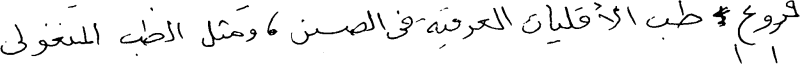

فروع # طب الأقليات العرقية في الصين، ومثل الطب المنغولي


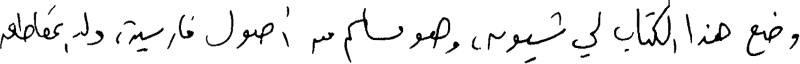

وضع هذا الكتاب لي شيون، وهو مسلم من أصول فارسية، ولد بمقاطعه


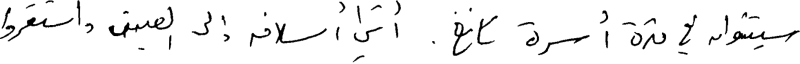

سيتشوان في فترة أسرة تانغ.  أتى أسلافه إلى الصين واستقروا


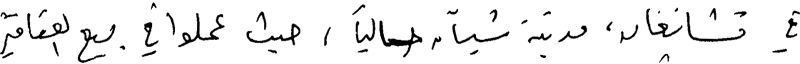

في تشانغان، مدينة شيآن حالياً، حيث عملوا في بيع العقاقير


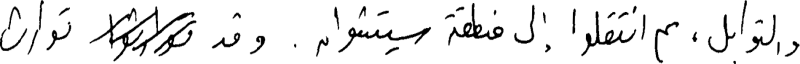

 والتوابل، ثم انتقلوا إلى منطقة سيتشوان.  وقد # توارث


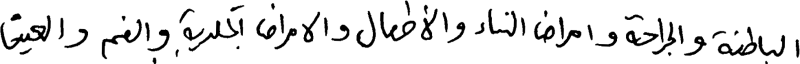

الباطنة والجراحة وأمراض النساء والأطفال والأمراض الجلدية والفم والعين


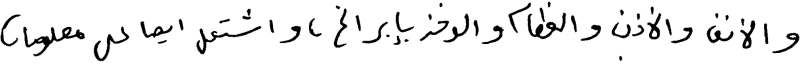

والأنف والأذن والعظام والوخز بإلإبر الخ، واشتمل أيضا على معلومات


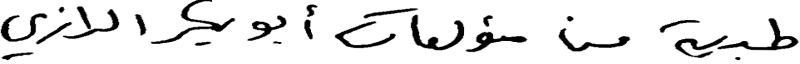

طبية من مؤلفات أبو بكر الرازي


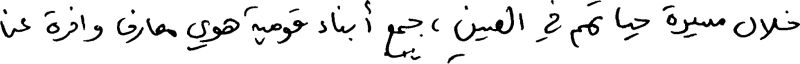

خلال مسيرة حياتهم في الصين، جمع أبناء قومية هوي معارف وافرة عن


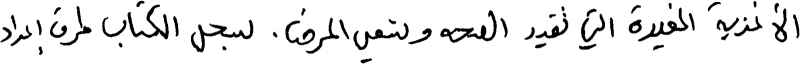

الأغذية المفيدة التي تفيد الصحة وتشفي المرض . سجل الكتاب طرق إعداد


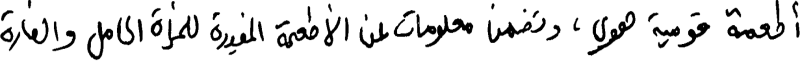

أطعمة قومية هوي، وتضمن معلومات عن الأطعمة المفيدة للمرأة الحامل والضارة


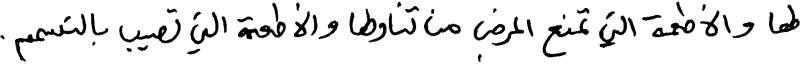

لها والأطعمة التي تمنع المرضى من تناولها والأطعمة التي تصيب بالتسمم .


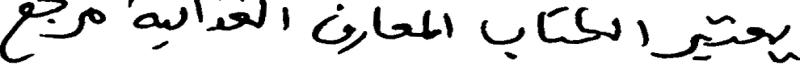

يعتبر الكتاب المعارف الغذائية مرجع


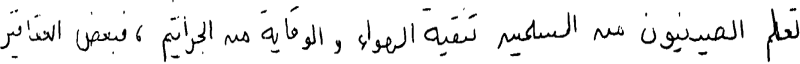

تعلم   الصينيون  من  المسلمين  تنقية الهواء  والوقاية من الجراثيم ، فبعض  العقاقير


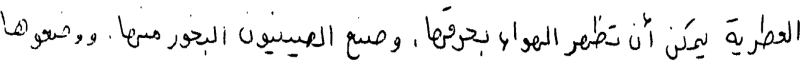

 العطرية  يمكن أن تظهر الهواء بحرقها. وصنع الصينيون البخور منها، ووضعوها


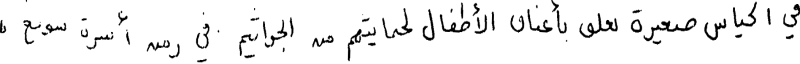

في أكياس صغيرة تعلق بأعناق الأطفال لحمايتهم من الجراثيم . في  زمن  أسرة سونغ،


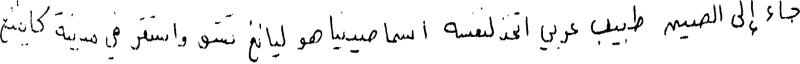

جاء إلى الصين  طبيب عربي اتخذ لنفسه  اسما صينيا هو ليانغ  تشو، واستقر في مدينة كايفنغ


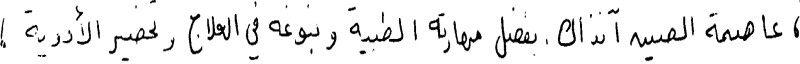

، عاصمة الصين آنذاك . بفضل  مهارته الطبية ونبوغه في العلاج وتحضير الأدوية ،


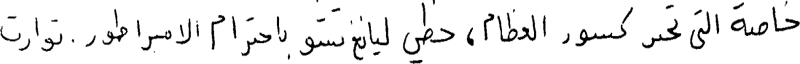

خاصة التي تجبر كسور  العظام، حظي ليانغ تشو باحترام الامبراطور. توارث


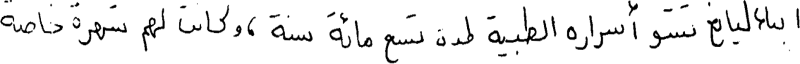

أبناء ليانغ تشو أسراره الطبية لمدة تسع مائة  سنة، وكانت لهم شهرة خاصة


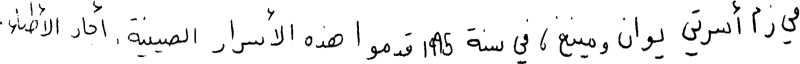

في زم أسرتي  يوان ومينغ، في سنة 1959 قدموا هذه الأسرار  الصينية. أجاد  الأطباء


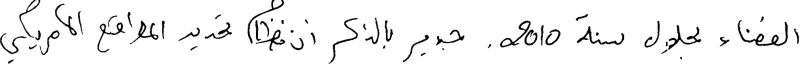

قبل سنة 2015، وقال إن الصين سوف ترسل عشرة أقمار اصطناعية ملاحية إلى


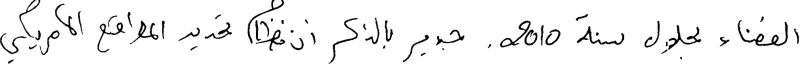

الفضاء بحلول سنة 2010 . جدير بالذكر أن نظام تحديد المواقع الأمريكي


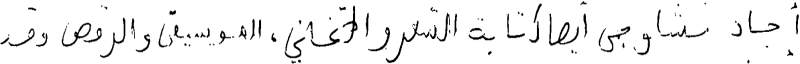

أجاد تشاو جي أيضا كتابة الشعر والأغاني، الموسيقى والرقص وقد


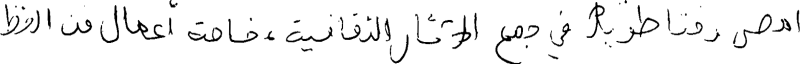

أمضى وقتا طويلا في جمع الآثار الثقافية، خاصة أعمال فن الخط


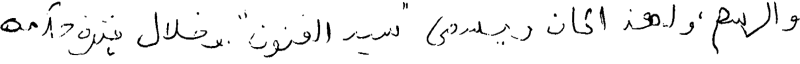

والرسم، ولهذا كان ويسمى "سيد الفنون". وخلال فترة حكمه


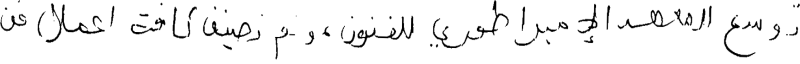

توسع المعهد الإمبراطوري للفنون، وتم تصنيف كافة أعمال فن


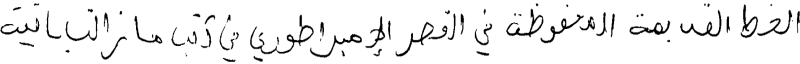

الخط القديمة المحفوظة في القصر الإمبراطوري في كتب مازالت باقية


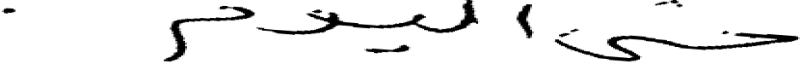

حتى اليوم.


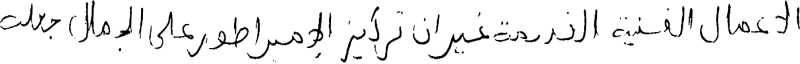

الاعمال الفنية القديمة.غير أن تركيز الإمبراطور على الجمال جعله


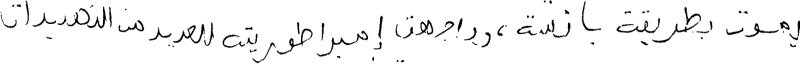

يموت بطريقة بائسة، وواجهت إمبراطوريته للعديد من التهديدات


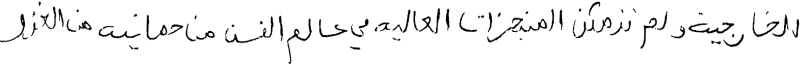

للخارجية ولم تتمكن المنجزات العالية في عالم الفن من حمايته من الغزو


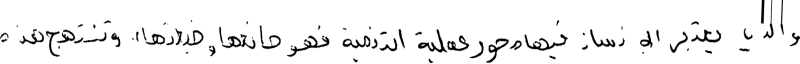

والذي يعتبر الإنسان فيها محور عملية التنمية فهو صانعها وضيعتها،. و تنتهج هذه


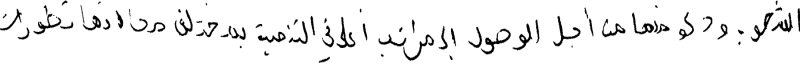

الشعوب وحكومتها من أجل الوصول إلى مراتب أعلى في التنمية بمختلف مجالاتها تطورات


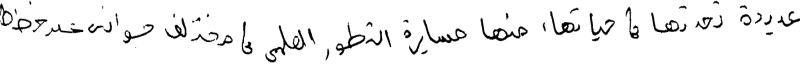

عديدة تحدثها في حياتها، منها مسايرة التطور العلمي في مختلف جوانبه عبر خطط


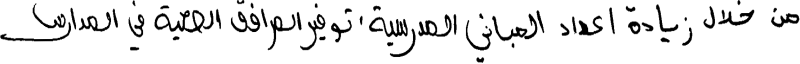

من خلال زيادة اعداد المباني المدرسية، توفير المرافق الصحية في المدارس


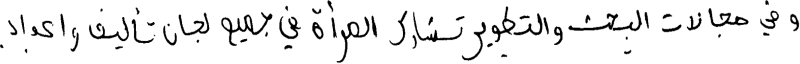

وفي مجالات البحث والتطوير تشارك المرأة في جميع لجان تأليف واعداد


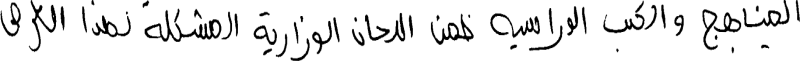

المناهج والكتب الدراسية ضمن اللجان الوزارية المشكلة لهذا الغرض


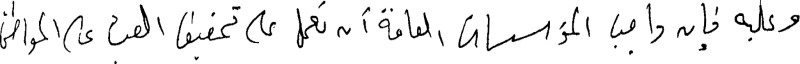

و عليه فإن واجب المؤسسات العامة أن تعمل على تخفيف العبء على المواطن


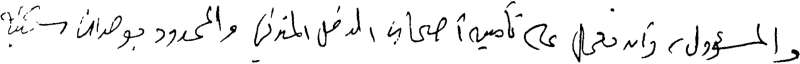

و المسؤول، و أن تعمل على تأمين أصحاب الدخل المتدني و المحدود بوحدات سكنيه


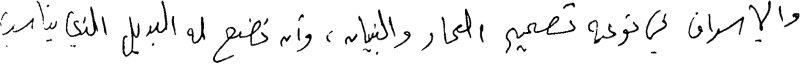

و الإسراف في نوعيه تصميم العمار و البنيان ، و أن تضع له البديل الذي يناسب


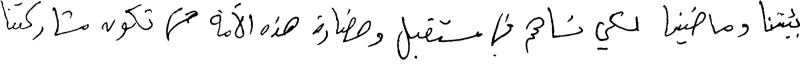

بيئتنا و ماضينا لكي نساهم في مستقبل و حضارة هذه الأمة حتى تكون مشاركتنا


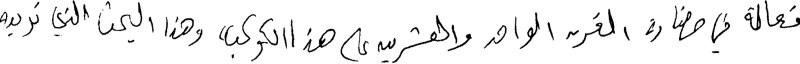

فعالة في حضارة القرن الواحد و العشرين على هذا الكوكب ، و هذا البحث الذي تريده


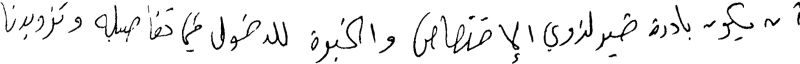

أن يكون بادرة خير لذوي الإختصاص و الخبرة للدخول في تفاصيله و تزويدنا


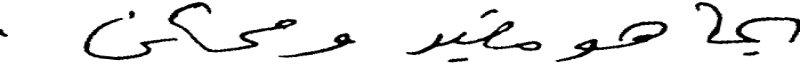

بما هو مفيد و ممكن.


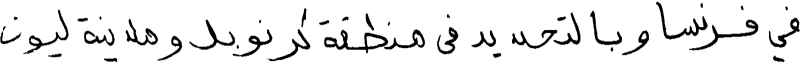

في فرنسا وبالتحديد في منطقة كرنوبل ومدينة ليون


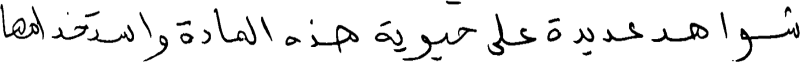

شواهد عديدة على حيوية هذه المادة واستخدامها


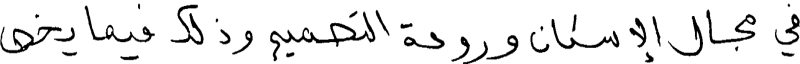

في مجال الإسكان وروعة التصميم وذلك فيما يخص


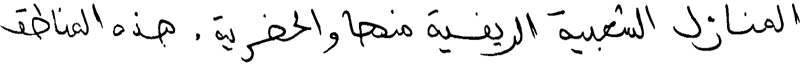

المنازل الشعبية الريفية منها والحضرية. هذه المناطق


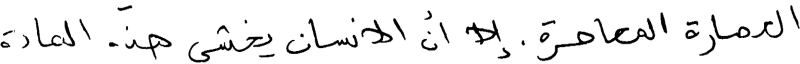

العمارة المعاصرة . إلا أن الانسان المعاصر يخشى هذه المادة


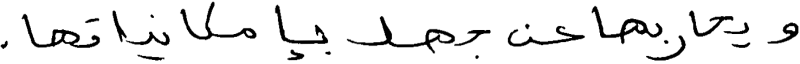

ويحاربها عن جهل بإمكانياتها.


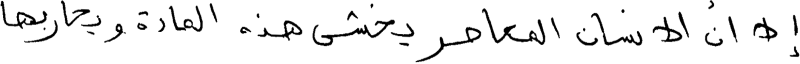

إلا أن الانسان المعاصر يخشى هذه المادة ويحاربها


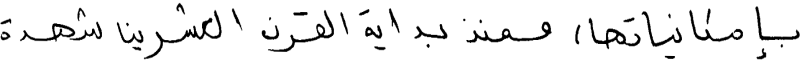

بإمكانياتها ، فمنذ بداية القرن العشرين شهدة


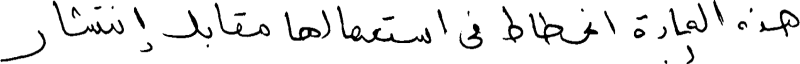

هذه المادة انحطاط في استعمالها مقابل إنتشار


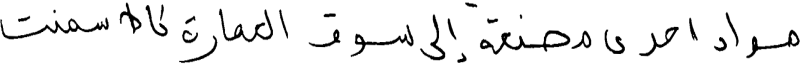

مواد أخرى مصنعة إلى سوق العمارة كالاسمنت


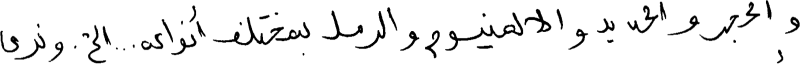

والحجر والحديد والالمنيوم والرمل بمختلف أنواعه ... الخ .ونرى


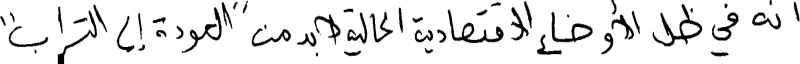

 أنه في ظل الأوضاع الاقتصادية الحالية لا بد من " العودة إلى التراب "


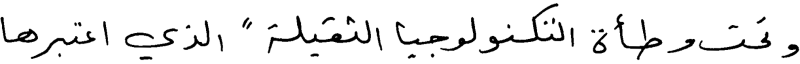

وتحت وطأة التكنولوجيا الثقيلة " الذي اعتبرها


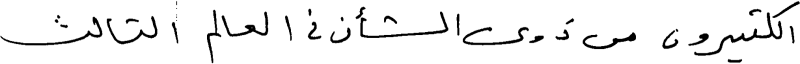

الكثيرون من ذوى الشأن في العالم الثالث


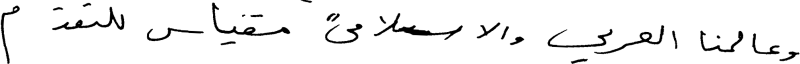

وعالمنا العربي والاسلامى " مقياس للتقدم


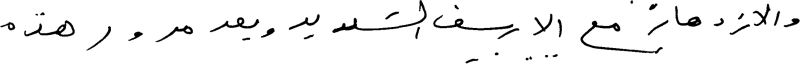

والازدهار " مع الاسف الشديد وبعد مرور هذه


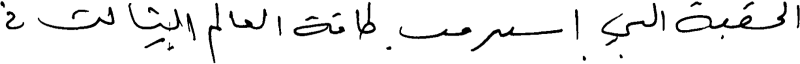

الحقبة التي استنزفت طاقة العالم الثالث في


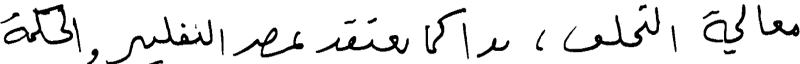

معالجة التخلف ، يـدا  كما نعتقد عصر التفكير والحكمة


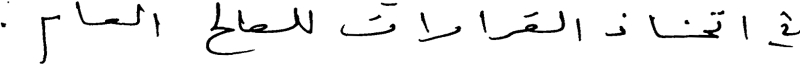

في اتخاذ القرارات للصالح العام.


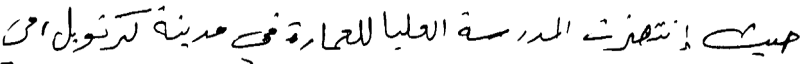

حيث إنتهزت المدرسة العليا للعمارة في مدينة كرتوبل،في


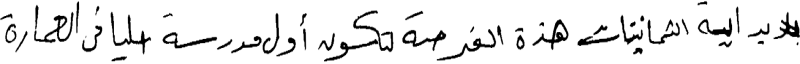

#بداية الثمانيتات هذه الفرصة لتكون أول مدرسة عليا في العمارة


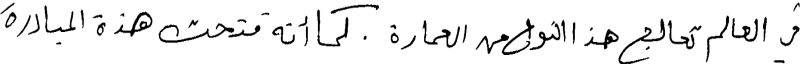

في العالم تعالج هذاالنوع من العمارة . كما أنه فتحت هذة المبادرة


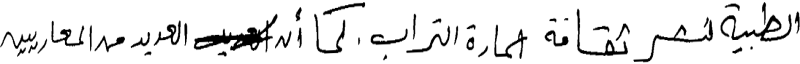

الطبية لنشر ثقافة عمارة التراب .كما أن # العديد من المعماريين


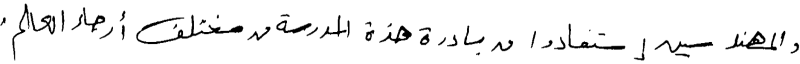

والمهندسين إستفادوا من بادرة هذة المدرسة من مختلف أرجاء العالم .


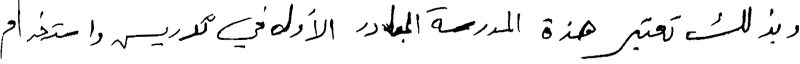

وبذلك تعتبر هذة المدرسة المبادر الأول في تدريس واستخدام


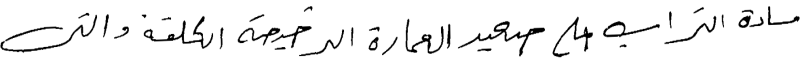

مادة التراب على صعيد العمارة الرخيصة الكلقة  والتى


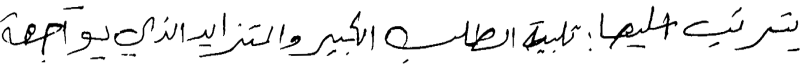

يترتب عليها : تلبية الطلب الكبير والمتزايد الذي يواجهه


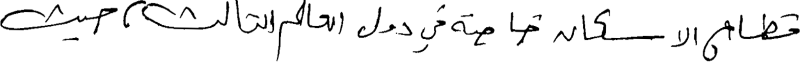

قطاع الاسكان خاصة في دول العالم الثالث،حيث


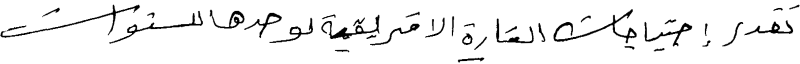

تقدر إحتياجات القارة الاقريقية لوحدها للسنوات


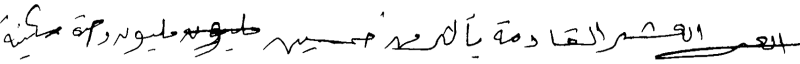

# العشر القادمة يأكثر من خمسين # مليون وحدة سكنية


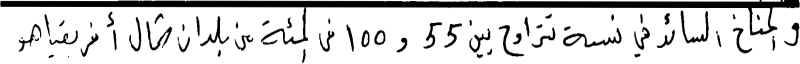

والمناخ السائد في نسبة تتراوح بين 55 و 100 في المائة من بلدان شمال أفريقيا هو


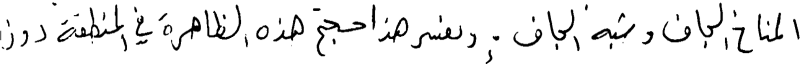

المناخ الجاف وشبه الجاف . ويفسر هذا حجم هذه الظاهرة في المنطقة دون


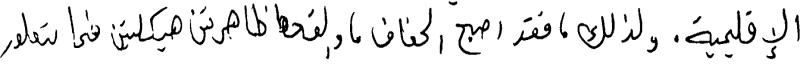

الإقليمية . ولذلك ، فقد أصبح الجفاف ، والقحط ظاهرتين هيكليتين فيما يتعلق


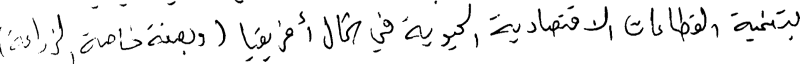

بتنمية القطاعات الاقتصادية الحيوية في شمال أفريقيا ( وبصفة خاصة الزراعة)


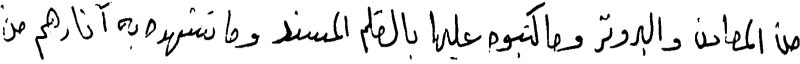

من المعادن والبرونز وما كتبوه بالقلم المسند وما تشهده به آثارهم من


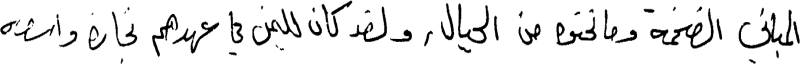

المباني الضخمة ومانحتوه من الحيال , ولقد كان لليمن في عهدهم تجارة واسعة


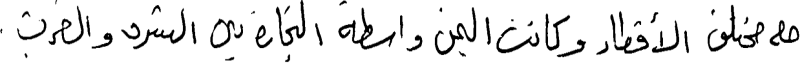

مع مختلف الأقطار وكانت اليمن واسطة التجارة بين الشرف والغرب .


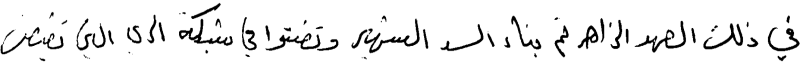

في ذلك العهد الزاهر تم بناء السد الشهير وتضتوا في شبكة الري التي تفيض


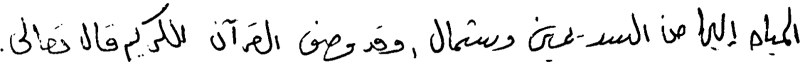

المياه إليها من السد يمنى وشمال ,وقد وصف القرآن الكريم قال تعالى.


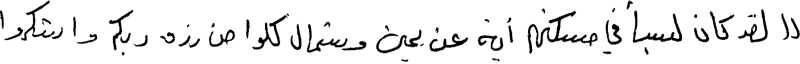

(( لقد كان لسبأ في مسكنهم أية عن يمين وشمال كلوا من رزق ربكم واشكروا


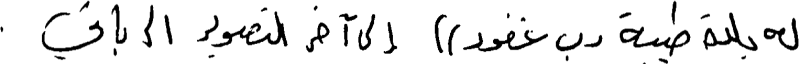

له بلدة طبية رب غفور)) إلى آخر التصوير الرباني  .


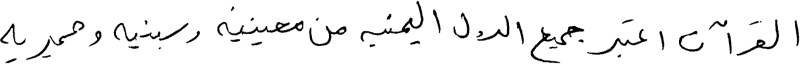

القرآن اعتبر جميع الدول اليمنيه من معينيه وسبئيه وحميريه


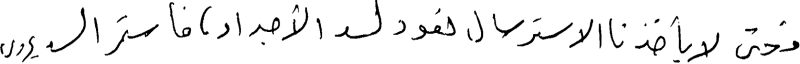

فحتى لا يأخذنا الاسترسال نعود لسد الأجداد ، فأستمر السد يروى


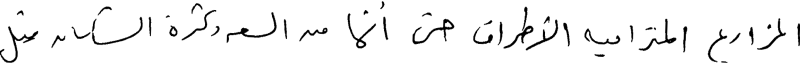

المزارع المتراميه الأطراف حتى أنها من السعه وكثرة السكان قيل


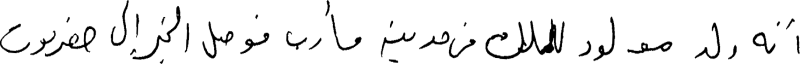

أنه ولد مولود للملك فى مدينه مأرب فوصل الخبر إلى حضر موت


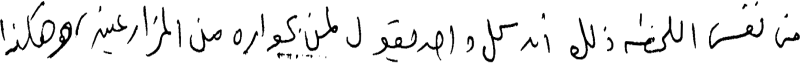

 فى نفس اللحظه ذلك أن كل واحد يقول لمن بجواره من المزارعين ، وهكذا


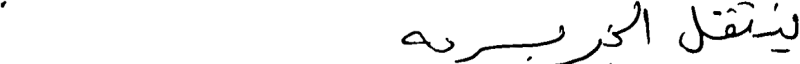

ينتقل الخبر بسرعه


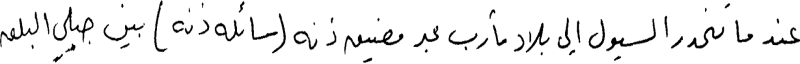

عندما تنحدر السيول إلى بلاد مآرب عبر مضيق ذنه (سائله ذنه ) بين جبلي البلق


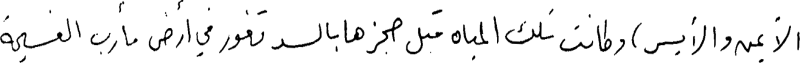

الأيمن والأيسر،وكانت تلك المباه قبل حجزها بالسد تغور في أرض مأدب الفسيحة


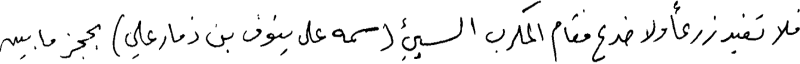

فلا تفيد زرعاً ولا ضرع فقام المكرب السبيء (سمه على ينوف بن ذمارعلي ) بحجز ما بين


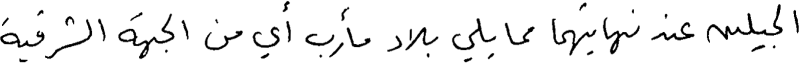

الجيلين عند نهايتهما مما يلي بلاد مأرب أي من الجهة الشرقية


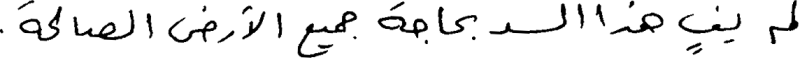

لم يفٍ هذا السد بحاجة الأرض الصالحة .


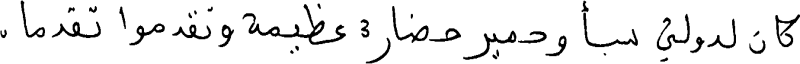

كان لدولتي سبأ وحمير حضارة عظيمة وتقدموا تقدما .


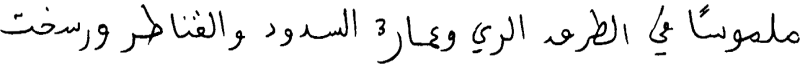

ملموساً في الطرق الري وعمارة السدود والقناطر ورسخت


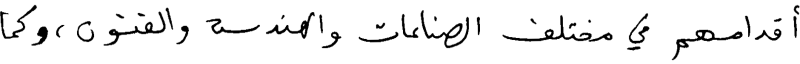

أقدامهم في مختلف الصناعات والهندسة والفنون ، و كما


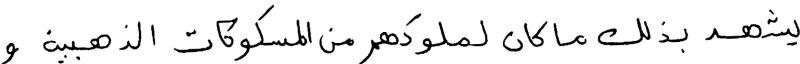

يشهد بذلك ما كان لملوكهم من المسكوكات الذهبية و


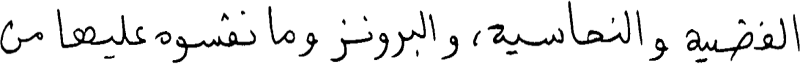

الفضية والنحاسية ، والبرونز وما نقشوه عليها من


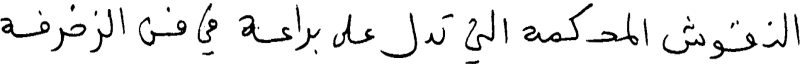

النقوش المحكمة التي تدل على براعة  في فن الزخرفة


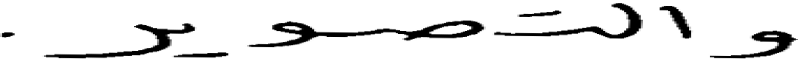

والتصوير.


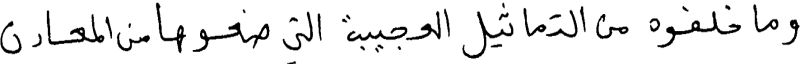

وما خلفوه من التماثيل العجيبة التي صنعوها من المعادن


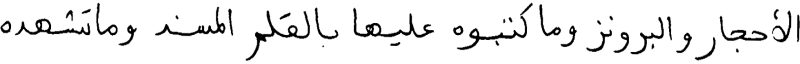

الأحجار والبرونز وما كتبوه عليها بالقلم المسند وما تشهده


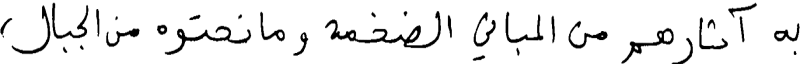

به آثارهم من المباني الضخمة وما نحتوه من الجبال ،


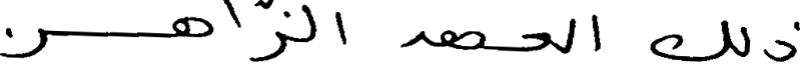

 ذلك العهد الزاهر.


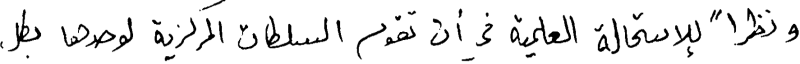

ونظراً للإستحالة العلمية في أن تقوم السلطات المركزية لوحدها بكل


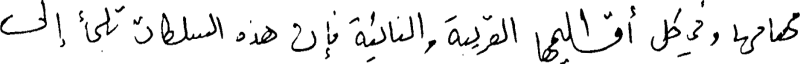

مهامها وفي كل أقليمها القريبة والنائية فإن هذه السلطات تلجأ إلى


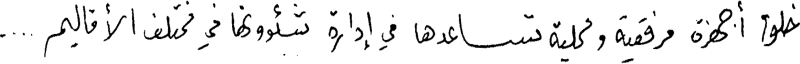

خلق أجهزة مرفقية ومحلية تساعدها في  إدارة شئوونها في مختلف الأقاليم....


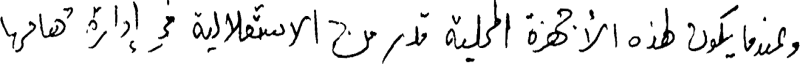

وعندما يكون لهذه الأجهزة المحلية قدر من الاستقلالية في إدارة مهامها


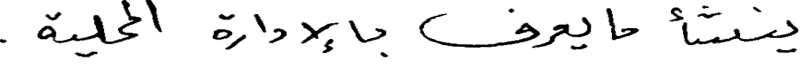

ينشأ ما يعرف بالإدارة المحلية.


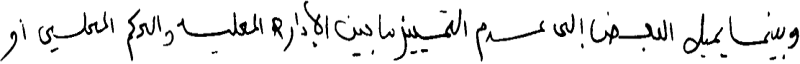

وبينمــا يميل البعــض إلى عــدم التمــييز ما بين الإدارهـ المحليــه و الحكم المحلــي أو


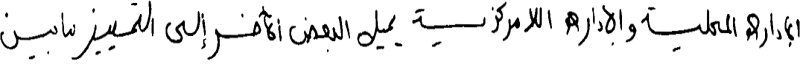

 الإدارهـ المحليــة والإداره اللا مركزيــة يميل البعض الآخــر إلى التمييز ما بين


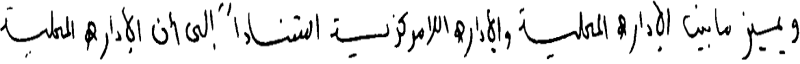

ويميز ما بين الإدارهـ المحلــة والإدراهـ اللا مركزيــة استناداً إلى أن الإدارهـ المحليــة


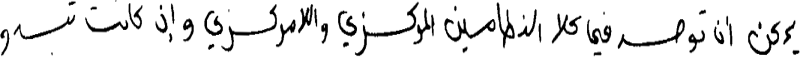

يمكن ان توجــد في كلا النظاميـن المركــزي واللا مركــزي وإن كانت تبــدو


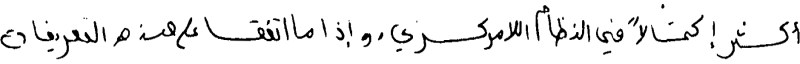

أكــثر إكتمــالاً في النظام اللامركـــزي. وإذا ما اتفقــا على هذه التعريفات


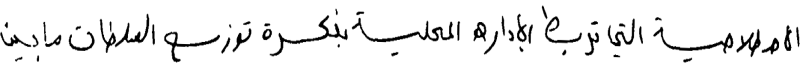

الاصطلاحيــة  التي تربط الإدارهـ المحليــة بفكـــرة توزيع السلطات ما بين


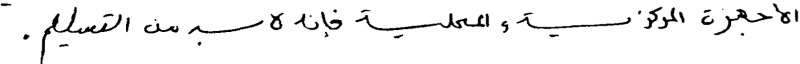

الأجهزة المركزيــة والمحليــة فإنه لابـــد من التسليم.


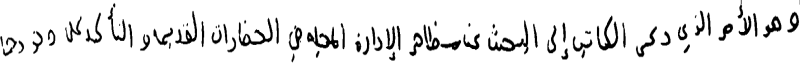

وهو الأمر الذي دعى الكاتب إلى البحث عن مظاهر الإدارة المجله في الحضارات القديمه والتأكيد على وجودها


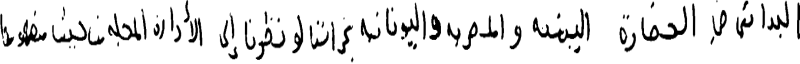

البدائي في  الحضارة   اليمنه والمصريه واليونانيه، نجد أننا لو نظرنا إلى  الإدارة المجلة من حيث مفهوخا


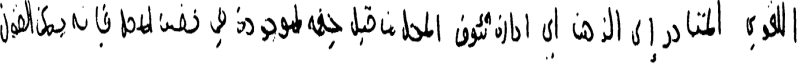

اللغوي   المتادد إلى الذهن اي ادارة ثئون  المحل من قبل جهه موجودة في نفس المحل فإنه يمكن القول


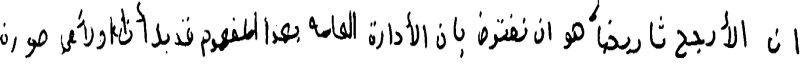

ان  الأرجح ثاريخياً هو ان نفترض بأن الإدارة العامه بهذا المفهوم قد بدأت أولاً مى صورة


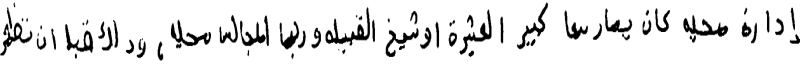

إدارة محيه كان يمارسها  كبير العشيرة أوشيخ القبيله وربما المجالس محليه ، وذلك قبل أن تظهر


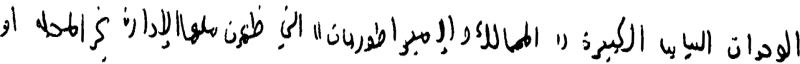

الوحدات السيابى الكبيرة ( الممالك والإمبراطوريات) التي ظهرت معها الإدارة نجد المحله  أو


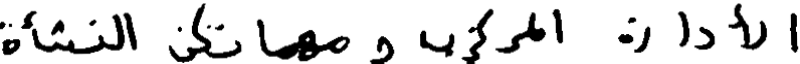

الإدارة   المركزيه ومهما تكن النشأة .


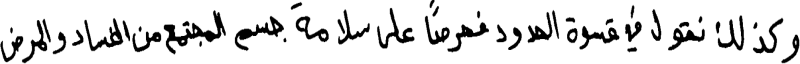

وكذلك نقول في قسوة الحدود فحرصًا على سلامة جسم المجتمع من الفساد والمرض


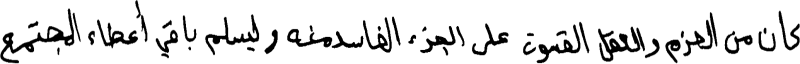

كان من الحزم والعقل القسوة على الجزء الفاسد منه و ليسلم باقي أعطاء المجتمع


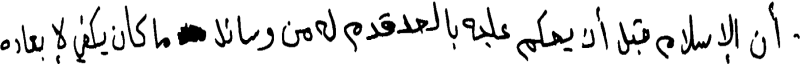

. أن الإسلام قبل أن يحكم عليه بالحد قدم له من وسائل #  ما كان يكفي لإبعاده


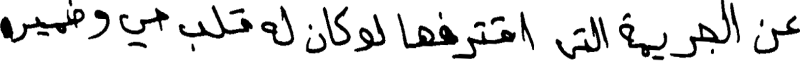

عن الجريمة التي اقترفها لو كان له قلب حي وضمير،


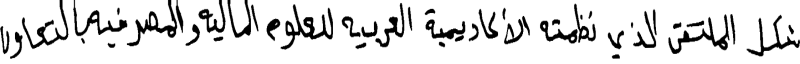

شكل الملتقى الذي نظمته الأكاديمية العربيه للعلوم الماليه والمصرفيه بالتعاون


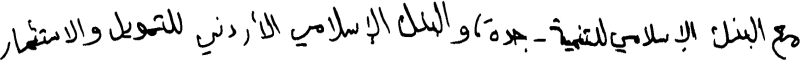

مع البنك الإسلامي للتنمية-جدة، والبنك الإسلامي الأردني للتمويل والاستثمار


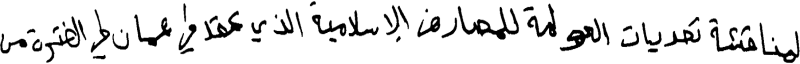

لمناقشة تحديات العولمة للمصارف الإسلامية الذي عقد في عمان في الفترة من


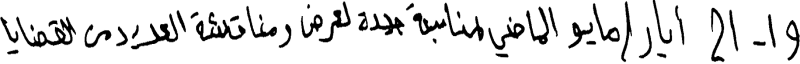

19 - 21 أيار/مايو الماضي مناسبة جيدة لعرض ومناقشة العديد من القضايا


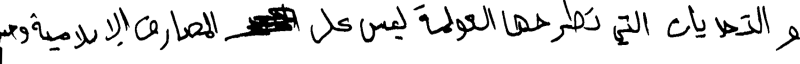

والتحديات التي تطرحها العولمة ليس على  # المصارف الإسلامية وحسب


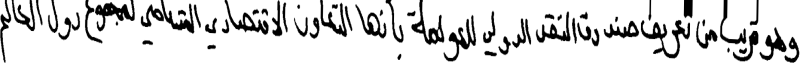

وهو قريب من تعريف صندوق النقد الدولي للعولمة بأنها التعاون الاقتصادي المتنامي لمجموع دول العالم


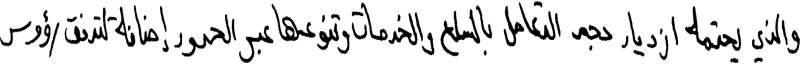

والذي يحتمه ازدياد حجم التعامل بالسلع والخدمات وتنوعها عبر الحدود إضافة لتدفق رؤوس


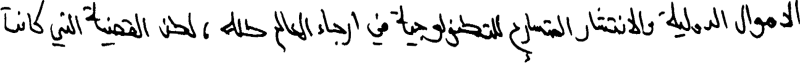

الاموال الدولية والانتشار المتسارع للتكنولوجية في ارجاء العالم كله، لكن القضية التي كانت


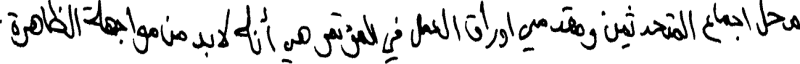

محل اجماع المتحدثين ومقدمي أوراق العمل في المؤتمر هي أنه لابد من مواجهة الظاهرة.


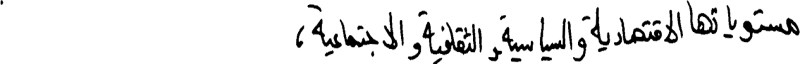

مستوياتها الاقتصادية والسياسية والثقافية والاجتماعية،


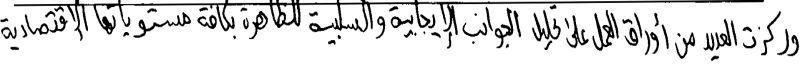

وركزت العديد من أوراق العمل على تحليل الجوانب الإيجابية والسلبية للظاهرة بكافة مستوياتها الإقتصادية


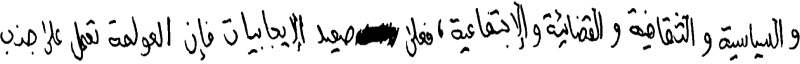

والسياسية والثقافية والقضائية والإجتماعية، فعلى # صعيد الإيجابيات فإن العولمة تعمل على جذب


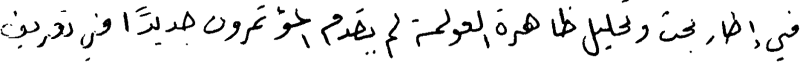

في إطار بحث وتحليل ظاهرة العولمة لم يقدم المؤتمرون جديداً في تعريف


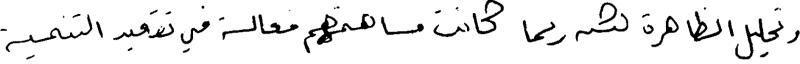

وتحليل الظاهرة لكن ربما كانت مساهمتهم فعالة في تقعيد التنمية


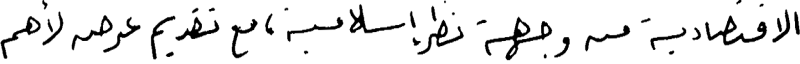

الاقتصادية من وجهة نظر إسلامية، مع تقديم عرص لأهم


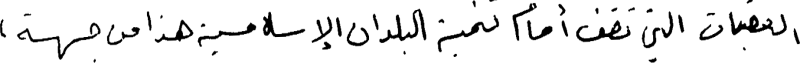

العقبات التي تقف أمام تنمية البلدان الإسلامية هذا من جهة،


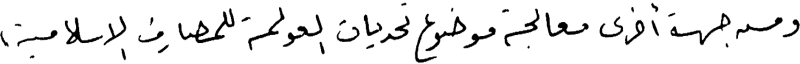

، ومن جهة أخرى معالجة موضوع تحديات العولمة للمصارف الاسلامية


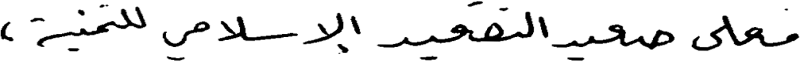

فعلى صعيد التقعيد الإسلامي للتنمية،


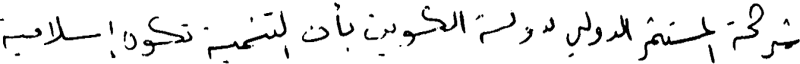

شركة المستثمر الدولي بدولة الكويت بأن التنمية تكون إسلامية


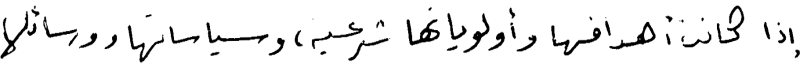

إذا كانت أهدافها وأولوياتها شرعية، وسياساتها ووسائلها


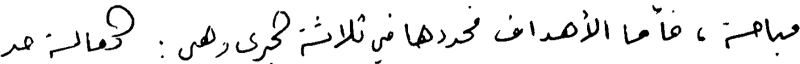

مباحة، فأما الأهداف فحددها في ثلاثة كبرى وهي: كفالة حد


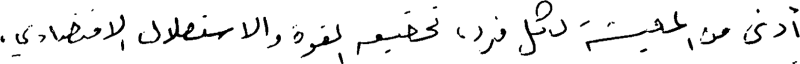

أدنى من المعيشة لكل فرد، تحقيق القوة والاستقلال الاقتصادي،


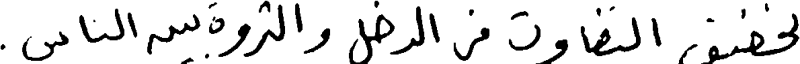

 تخفيف التفاوت في الدخل والثروة بين الناس.


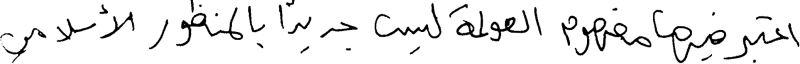

اعتبر فيها مفهوم العولمة ليس جديداً بالمنظور الأسلامي


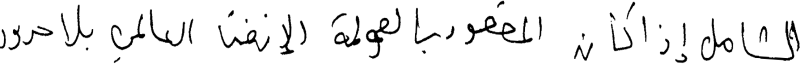

الشامل إذا كان المقصود بالعولمة الإنفتاح العالمي بلا حدود


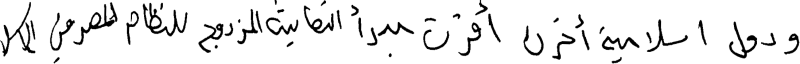

ودول اسلامية أخرى أقرت مبدأ التعايش المزدوج للنظام المصرفي الإسلامي


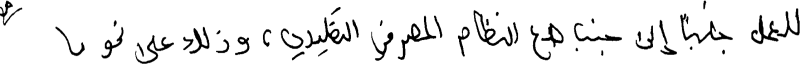

 للعمل جنباً إلى جنب مع النظام المصرفي التقليدي، وذلك على نحو ما


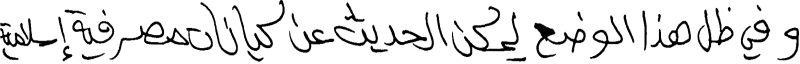

وفي ظل هذا الوضع يمكن الحديث عن كيانات مصرفية إسلامية


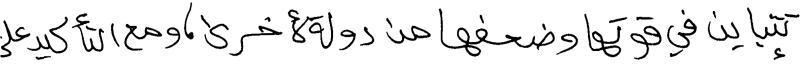

تتباين في قوتها وضعفها من دولة لأخرى، ومع التأكيد على


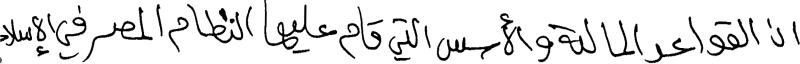

أن القواعد المالية والأسس التي قام عليها النظام المصرفي الإسلامي


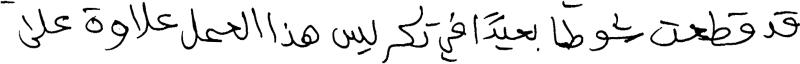

 قد قطعت شوطاً بعيداً في تكريس هذا العمل علاوة على


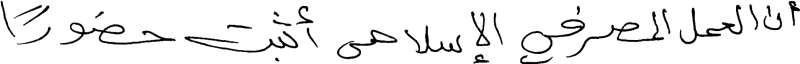

أن العمل المصرفي الإسلامي أثبت حضوراً


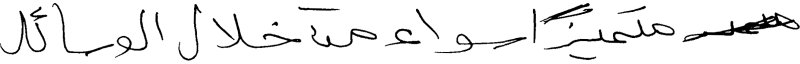

# متميزاً سواء من خلال الوسائل


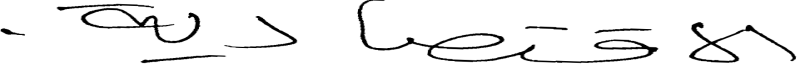

الاقتصادية.


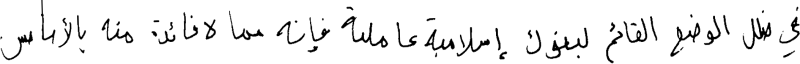

في ظل الوضع القائم لبنوك إسلامية عاملة فإنه مما لا فائدة منه بالأساس


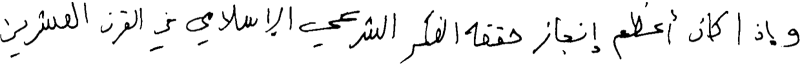

 وإذا كان أعظم إنجاز حققه الفكر الشرعي الإسلامي في القرن العشرين


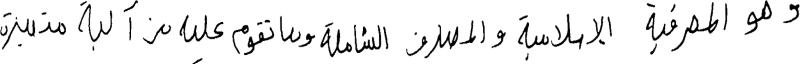

وهو المصرفية الإسلامية والمصارف الشاملة وما تقوم عليه من آلية متميزة


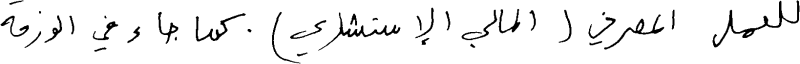

للعمل المصرفي (المالي الإستشاري). كما جاء في الورفة


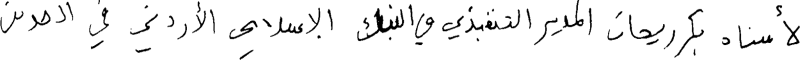

لأستاذ بكر ريحان المدير التنفيذي في البنك الإسلامي الأردني في الحد من


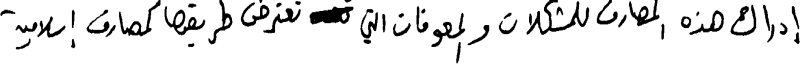

إدراك هذه المصارف للمشكلات والمعوقات التي # تعترض طريقها كمصارف إسلامية


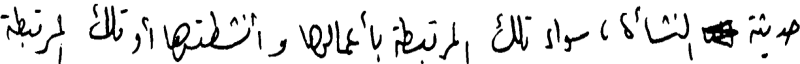

حديثة # النشأة، سواء تلك المرتبطة بأعمالها وأنشطتها أو تلك المرتبطة


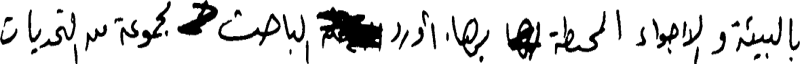

بالبيئة والأجواء المحيطة # بها . أورد # الباحث # مجموعة من التحديات


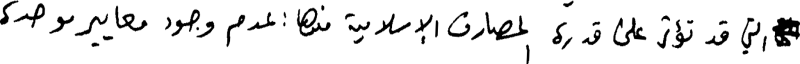

#التي قد تؤثر على قدرة المصارف الإسلامية منها: عدم وجود معايير موحدة


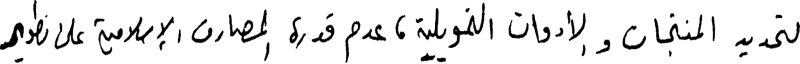

لتحديد المنتجات والأدوات التمويلية، عدم قدرة المصارف الإسلامية على تطوير


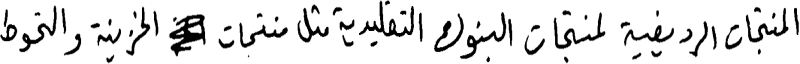

المنتجات الرديفية لمنتجات البنوك التقليدية مثل منتجات # الخزينة والتحوط


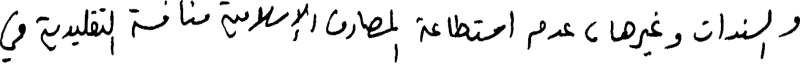

والسندات وغيرها، عدم استطاعة المصارف الإسلامية منافسة التقليدية في


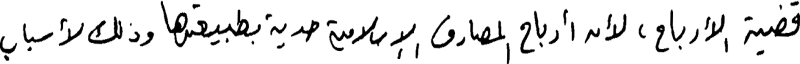

قضية الأرباح، لأن أرباح المصارف الإسلامية حدية بطبيعتها وذلك لأسباب


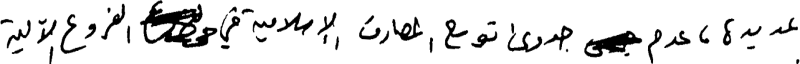

عديدة، عدم # جدوى توسع المصارق الإسلامية في #الفروع الآلية


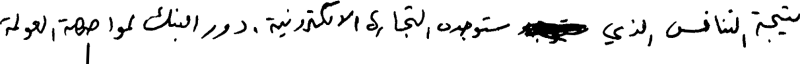

نتيجة التنافس الذي # ستوجده التجارة الالكترونية . دور البنك لمواجهة العولمة


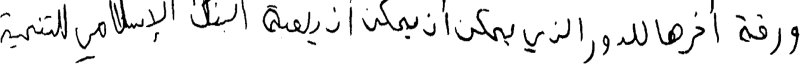

ورقة أخرها للدور الذي يمكن أن يمكن أن يلعبه البنك الإسلامي للتنمية


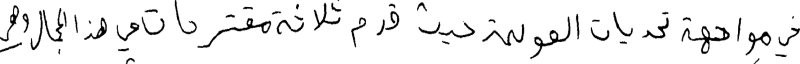

في مواجهة تحديات العولمة حيث قدم ثلاثة مقترحات في هذا المجال وهي


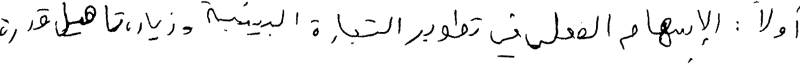

أولاً: الإسهام الفعلي في تطوير التجارة البينية وزيادة تأهيل قدرة


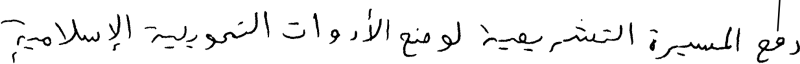

دفع المسيرة التشريعية لوضع الأدوات التمويلية الإسلامية


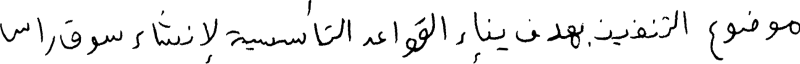

موضوع التنفيذ بهدف يناء القواعد التأسيسية لإنشاء سوق رأس


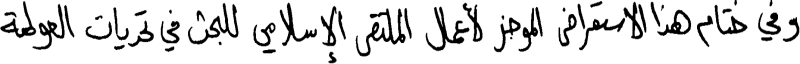

وفي ختام هذا الاستعراض الموجز لأعمال الملتقى الإسلامي للبحث في تحديات العولمة


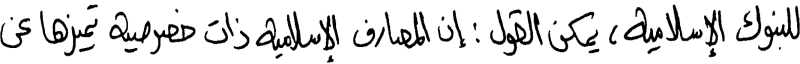

للبنوك الإسلامية، يمكن القول: إن المصارف الإسلامية ذات خصوصية تميزها عن


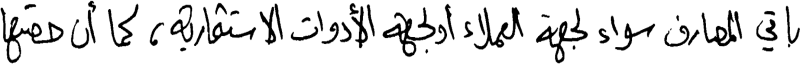

باقي المصارف سواء لجهة العملاء أو لجهة الأدوات الاستثمارية، كما أن حصتها


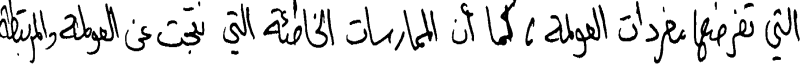

التي تفرضها مفردات العولمة، كما أن الممارسات الخاطئة التي نتجت عن العولمة والمرتبطة


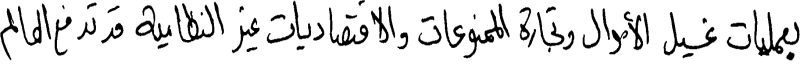

بعمليات غسيل الأموال وتجارة الممنوعات والاقتصاديات غير النظامية قد تدفع العالم


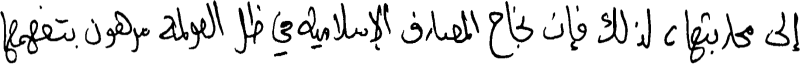

 إلى محاربتها، لذلك فإن نجاح المصارف الإسلامية في ظل العولمة مرهون بتفهمها


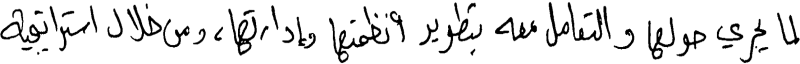

لما يجري حولها والتعامل معه بتطوير أنظمتها وإدارتها، ومن خلال استراتيجية


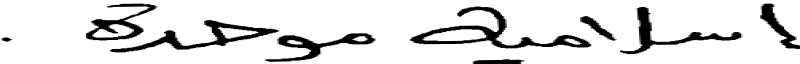

إسلامية موحدة.


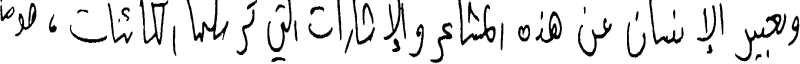

وتعبير الإنسان عن هذه المشاعر والإشارات التي ترسلها الكائنات، هو ما


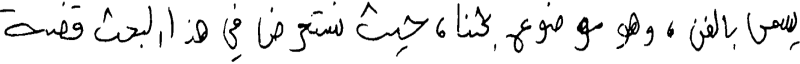

يسمى بالفن، وهو موضوع بحثنا، حيث نستعرض في هذا البحث قضية


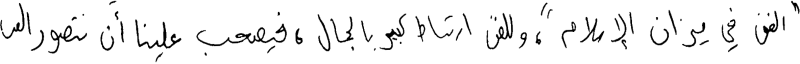

 "الفن في ميزان الإسلام" ،وللفن ارتباط كبير بالجمال، فيصعب علينا أن نتصور الفن


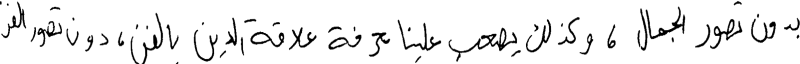

بدون تصور الجمال، وكذلك يصعب علينا معرفة علاقة الدين بالفن، دون تصور الفن


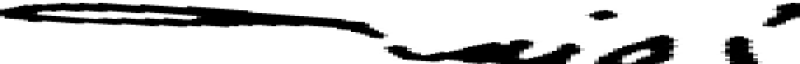

نفسه


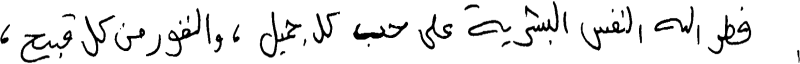

فطر الله النفس البشرية على حب كل جميل، والنفور من كل قبيح،


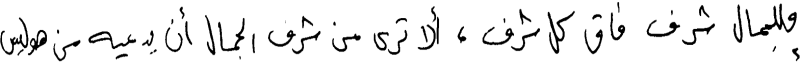

فللجمال شرف فاق كل شرف،  ألا ترى من شرف الجمال أن يدعيه من هو ليس


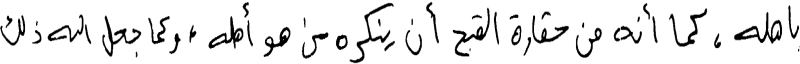

 بأهله، كما أنه من حقارة القبح أن ينكره من هو أهله، وكما جعل الله ذلك


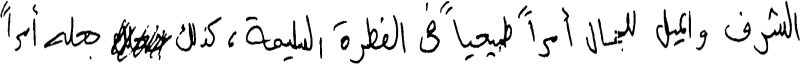

 الشرف والميل للجمال أمراً طبيعياً في الفطرة السليمة، كذلك # جعله أمرًا


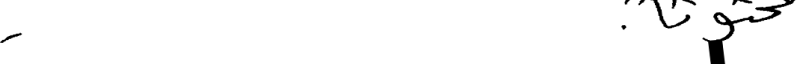

محثوثاً.


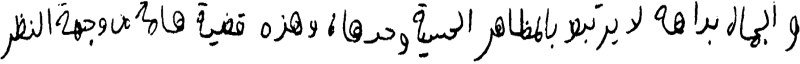

والجمال بداهه لا يرتبط بالمظاهر الحسية وحدها، وهذه قضية هامة من وجهة النظر


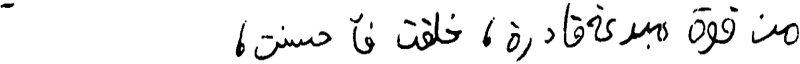

من قوة مبدعة قادرة، خلقت فأحسنت،


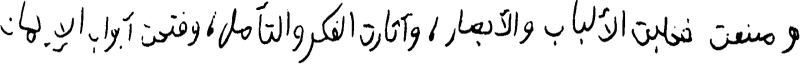

وصنعت فخلبت الألباب والأبصار، وأثارت الفكر والتأمل، وفتحت أبواب الإيمان


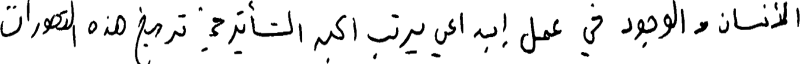

الأنسان والوجود في عمل إبداعي يرتب اكبر التأثير في ترسيخ هذه التصورات


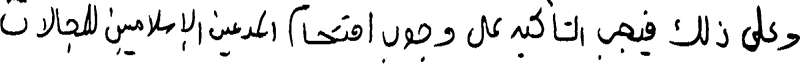

وعلى ذلك فيجب التأكيد على وجوب اقتحام المدعين الإسلاميين للمجالات


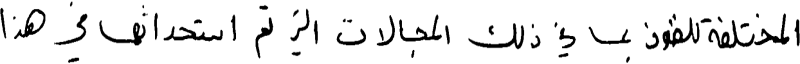

المختلفة للفنون بما في ذلك المجالات التي تم استحداثها في هذا


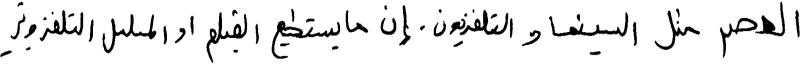

العصر مثل السينما والتلفزيون . إن ما يستطيع الفيلم او المسلسل التلفزيوني


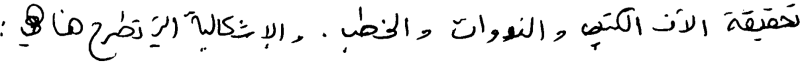

تحقيقة الاّف الكتب والندوات والخطب . والإشكالية التي تطرح هنا هي :


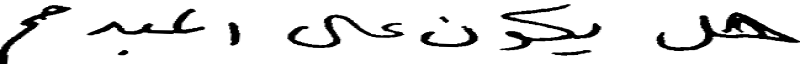

 هل يكون على المبدع


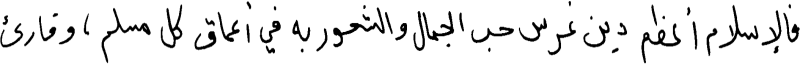

فالإسلام أعظم دين غرس حب الجمال والشعور به في أعماق كل مسلم، وقارئ


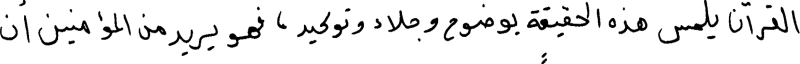

القرآن يلمس هذه الحقيقة بوضوح وجلاء وتوكيد ، فهو يريد من المؤمنين أن


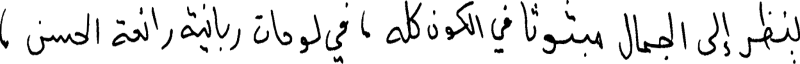

ينظر إلى الجمال مبثوثاً في الكون كله، في لوحات ربانية رائعة الحسن ،


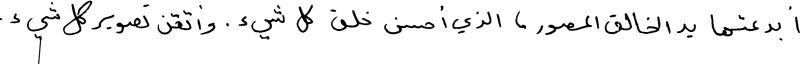

أبدعتها يد الخالق المصور ، الذي أحسن خلق كل شيء.  وأتقن تصوير كل شيء.


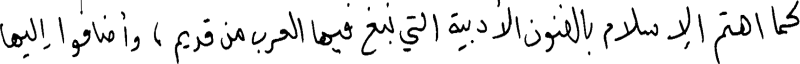

كما اهتم الإسلام بالفنون الأدبية التي نبغ فيها العرب من قديم ، وأضافوا إليها


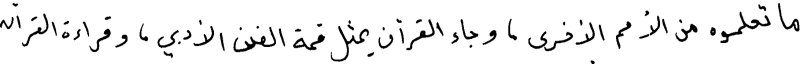

ما تعلموه من الأمم الأخرى ، وجاء القرآن يمثل قمة الفن الأدبي ، وقراءة القرآن


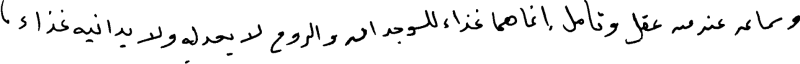

 وسماعه عند من عقل وتأمل إنما هما غذاء للوجدان والروح لا يعدله ولا يدانيه غذاء ،


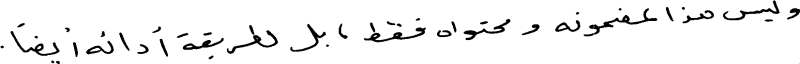

 وليس هذا لمضمونه ومحتواه فقط ، بل لطريقة أدائه أيضاً.


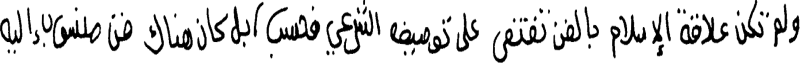

ولم تكن علاقة الإسلام بالفن تقتصر على توصيفه الشرعي فحسب، بل كان هناك فن منسوب إليه


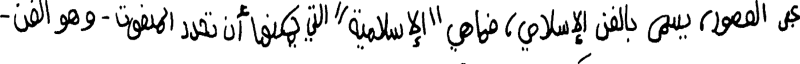

عبر العصور، يسمى بالفن الإسلامي، فما هي "الإسلامية" التي يمكنها أن تحدد المنعوت - وهو الفن-


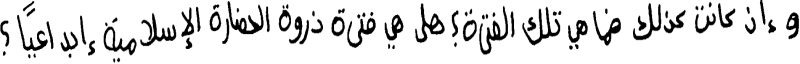

وإن كانت كذلك فما هي تلك الفترة ؟ هل هي فترة ذروة الحضارة الإسلامية إبداعيًا؟


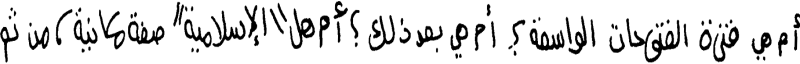

أم هي فترة الفتوحات الواسعة؟ أم هي بعد ذلك؟ أم هل "الإسلامية" صفة مكانية، من ثم


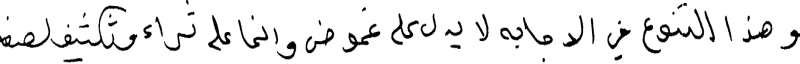

وهذا التنوع في الاجابه لا يدل على غموض وانما على ثراء وثكثيف الصفه


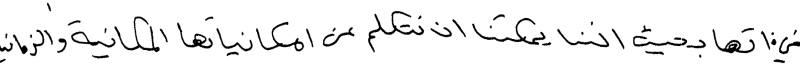

في ذاتها بحيث اننا يمكننا ان نتكلم عن امكانياتها المكانية والزمانيه


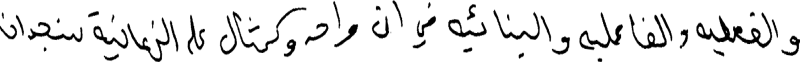

والفعليه والفاعليه والبنائيه في ان واحد  وكمثال على الزمانية سنجد ان


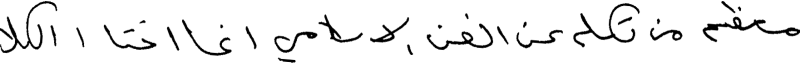

معظم من تكلم عن الفن الاسلامي انما اختاروا الكلام عن حقبة الحضار


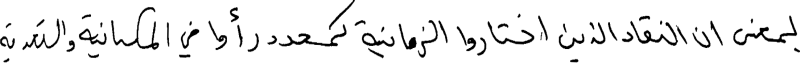

بمعنى ان النقاد الذين اختاروا الزمانية كمحدد رأوا في المكانية والتعدية


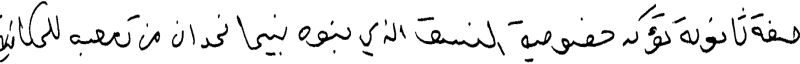

صفة ثانوية تؤكد خصوصية النسق الذي بنوه  بينما نحد ان من تعصب للمكانية


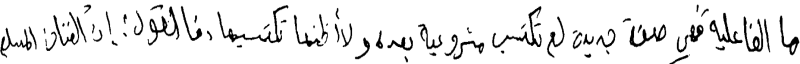

ما الفاعلية فهي صفة جديدة لم تكتسب مشروعية بعد، ولا أظنها تكتسبها ، فالقول: إن الفنان المسلم


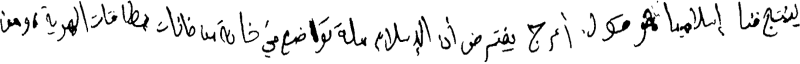

ينتج فنا إسلاميا، هو قول أعرج يفترض أن الإسلام ملة تو#ضع في خانة من خانات بطاقات الهوية، ومن


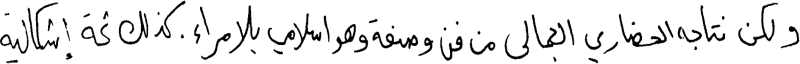

ولكن نتاجه الحضاري الجمالى من فن وصنعة وهو اسلامي بلا مراء  . كذلك ثمة إشكالية


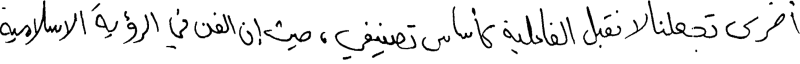

أخرى تجعلنا لا نقبل الفاعلية كأساس تصنيفي، حيث إن الفن في الرؤية الاسلامية


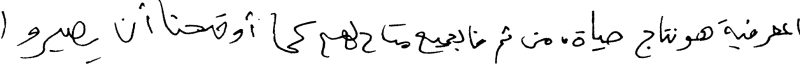

المعرفية هو نتاج حياة، من ثم فالجميع متاح لهم كما أوضحنا أن يصيروا


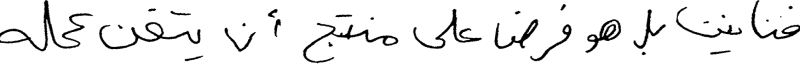

فنانين بل هو فرض على  منتج أن يتقن عمله


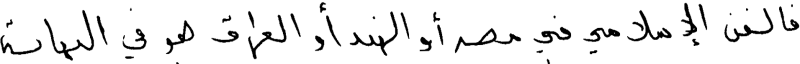

فالفن الإسلامي في مصر أو الهند أو العراق هو في النهاية


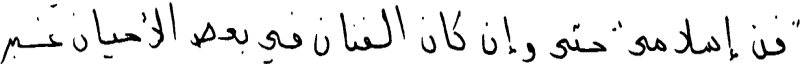

"فن إسلامي" حتى وإن كان الفنان في بعض الأحيان غير


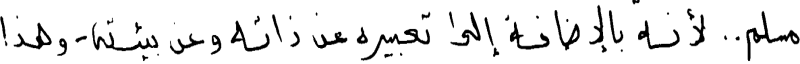

 مسلم   لأنه  بالإضافة إلى تعبيره عن ذاته وعن بيئته -وهذا


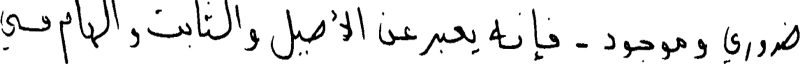

  ضروري وموجود - فإنه يعبر عن الأصيل والثابت والهام في


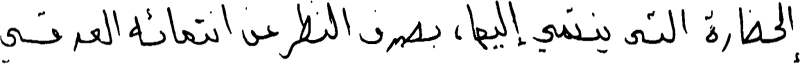

 الحضارة التي  يتمي إليها بصرف النظر عن انتمائه العرقي


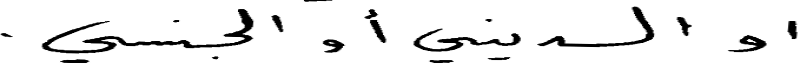

 أو الديني أو الجنسي .


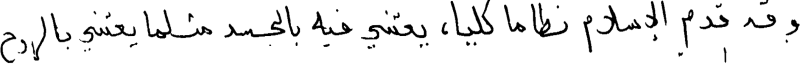

وقد فدم الإسلام نظاما كليا يعتني فيه بالجسد مثلما يعني بالروح


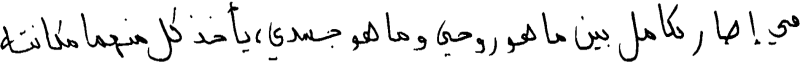

  في إطار تكامل بين ما هو روحي وما هو جسدي يأخذ كل  منهما مكانته


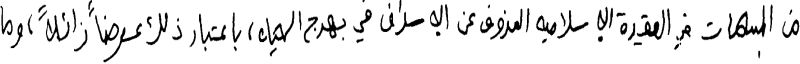

من المسلمات في العقيدة الإسلاميه العزوف عن الإسراف في بهرج الحياة، باعتبار ذلك عرضاً زائلاً، وما


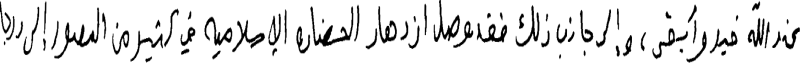

عند الله خير وأبقى، وإلى جانب ذلك فقد وصل ازدهار الحضاره الإسلاميه في كثير من العصور إلى درجه


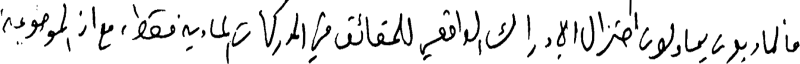

فالماديون يحاولون اختزال الإدراك الواقعي للحقائق في المدركات الماديه فقط، مع ان الموضوعية


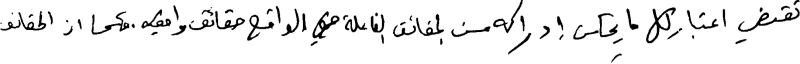

تقضي اعتبار كل ما يمكن إدراكه من الحقائق الفاعلة في الواقع حقائق . واقعيه فكما ان الحقائق


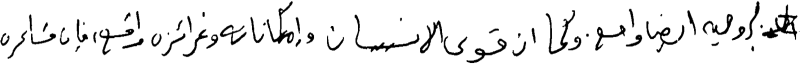

 # الروحيه ايضا واقع . وكما ان قوى الانسان وإمكاناته وغرائزه واقع، فإن مشاعره


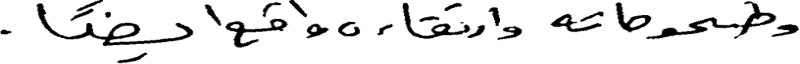

وطموحاته وارتقاءه واقع ايضًا .


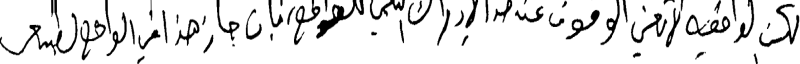

لكن الواقعيه لا تعني الوقوف عند حد الإدراك الىلبي للواقع، فإن جاز هذا في الواقع الطبيعي


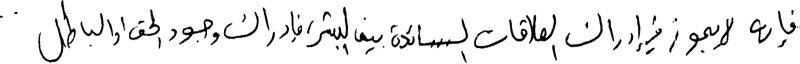

فإنه لا يجوز في إدراك العلاقات السائدة بين البشر، فإدراك وجود الحق او الباطل


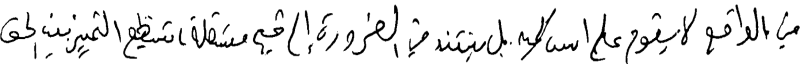

في الواقع لا يقوم على اسس كميه، بل ينتند في الضرورة إلى قيم مستقلة، تستطيع التمييز بين الحق


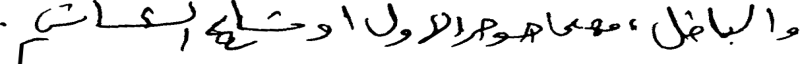

والباطل، مهما حوصر الاول او شاع الثاني .


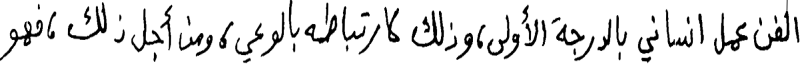

الفن عمل انساني بالدرجة الأولى، وذلك لارتباطه بالوعي، ومن أجل ذلك، فهو


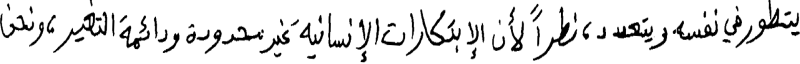

يتطور في نفسه ويتعدد، نطراً لأن الإبتكارات الإنسانية غير محدودة ودائمة التغير، ونحن


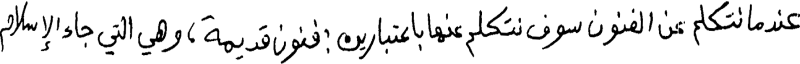

عندما نتكلم عن الفنون سوف نتكلم عنها باعتبارين : فنون قديمة، وهي التي جاء الإسلام


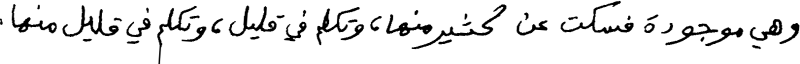

وهي موجودة فسكت عن كثير منها، وتكلم في قليل ، وتكلم في قليل منها.


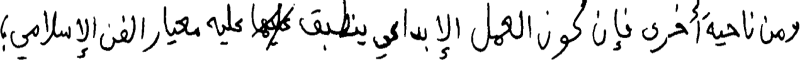

ومن ناحية أخرى فإن كون العمل الإبداعي ينطبق # عليه معيار الفن الإسلامي؛


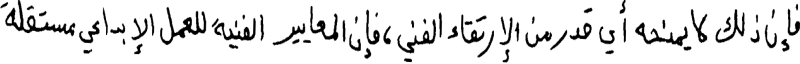

فإن ذلك لا يمنحه أي قدر من الإرتقاء الفني، فإن المعايير الفنية للعمل الإبداعي مستقلة


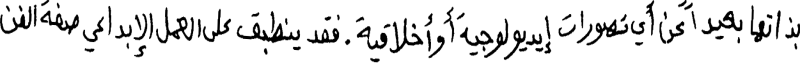

بذاتها بعيداً عن أي تصورات إيديولوجية أو أخلاقية . فقد ينطبق على العمل الإبداعي صفة الفن


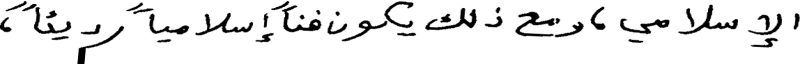

 الإسلامي، ومع ذلك يكون فناً إسلامياً رديئاً،


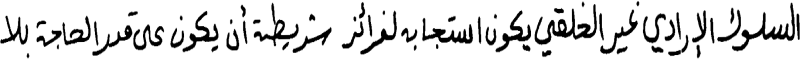

السلوك الإرادي غير الخلقي يكون استجابه لغرائز شريطة أن يكون على قدر الحاجة بلا


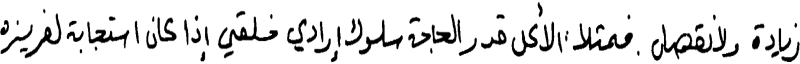

زيادة ولا نقصان.  فمثلا: الأكل قدر الحاجة سلوك إرادي خلقي إذا كان استجابة لغريزه


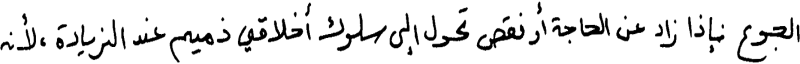

الجوع فإذا زاد عن الحاجة أو نقص تحول إلى سلوك أخلاقي ذميم عند الزيادة، لأنه


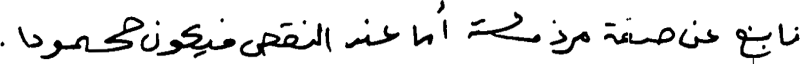

 نابغ عن صفة مرذولة  أما عند النقص فيكون محمودا.


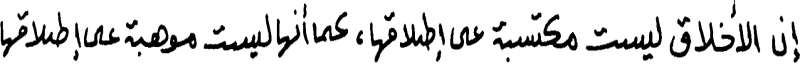

إن الأخلاق ليست مكتسبة على إطلاقها، كما أنها ليست موهبة على إطلاقها


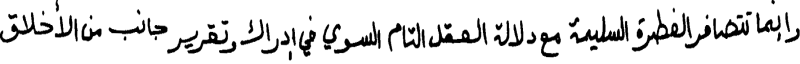

وإنما تتضافر الفطرة السليمة مع دلالة العقل التام السوي في إدراك وتقرير جانب من الأخلاق


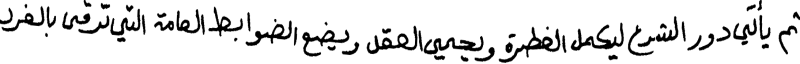

ثم يأتي دور الشرع ليكمل الفطرة ويحمي العقل ويضع الضوابط العامة التي ترقى بالفرد


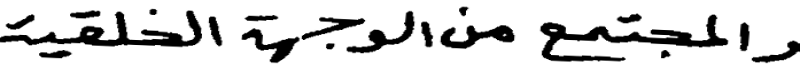

 والمجتمع من الوجهة الخلقية .


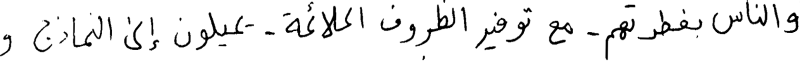

والناس بفطرتهم - مع توفير الظروف الملائمة - يميلون إلى النماذج و


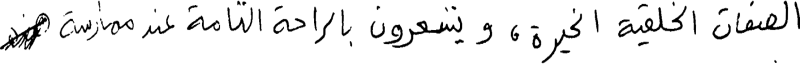

الصفات الخلقية الخيرة، ويشعرون بالراحة التامة عند ممارسة #


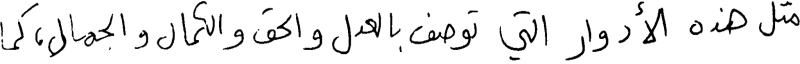

مثل هذه الأدوار التي توصف بالعدل والحق و الكمال والجمال، كما


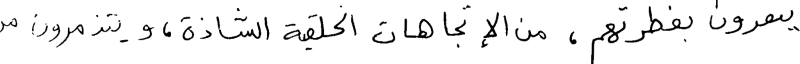

ينفدون بفطرتهم، من الإتجاهات الخلقية الشاذة، ويتذمرون من


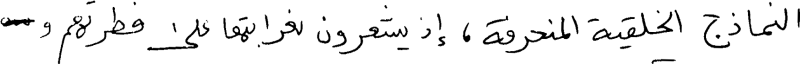

 النماذج الخلقية المنحرفة، إذ يشعرون بغرابتها على فطرتهم، و#


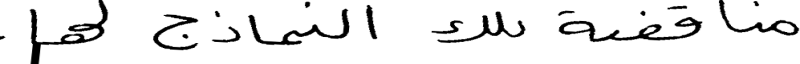

مناقضة تلك النماذج لها.


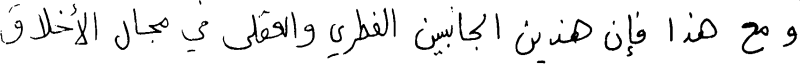

ومع هذا فإن هذين الجانبين الفطري والعقلي في مجال الأخلاق


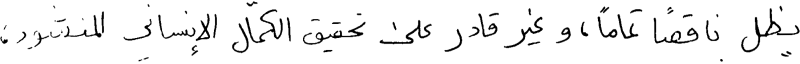

 يظل ناقصًا تماما، وغير قادر على تحقيق الكمال الإنساني المنشود،


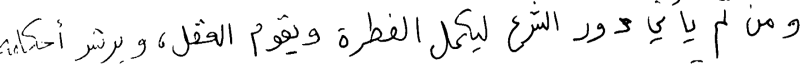

 ومن ثم يأتي دور الشرع ليكمل الفطرة ويقوم العقل، ويرشد أحكامه


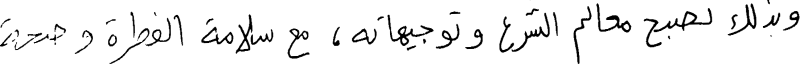

 وبذلك تصبح معالم الشرع وتوجيهاته، مع سلامة الفطرة وصحة


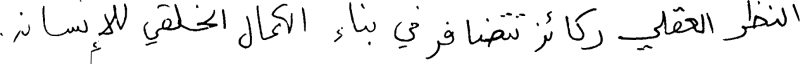

النظر العقلي ركائز تتضافر في بناء الكمال الخلقي للإنسان.


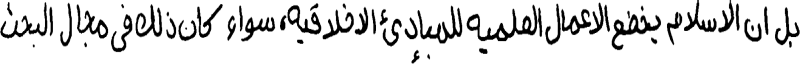

بل ان الاسلام يخضع الاعمال العلميه للمبادئ الأخلاقيه، سواء كان ذلك في مجال البحث


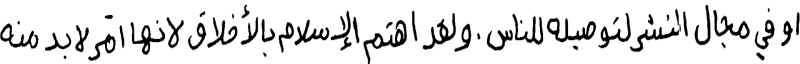

او في مجال النشر لتوصيله للناس . ولقد أهتم الإسلام بالأخلاق لانها امر لا بد منه


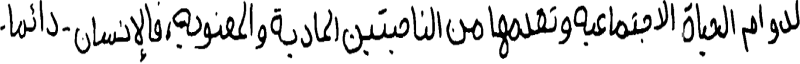

لدوام الحياة الاجتماعيه وتقدمها من الناحيتين المادية والمعنويه، فالإنسان -دائما -


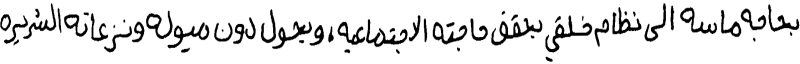

بحاجه ماسه الى نظام خلقي يحقق حاجته الاجتماعيه، ويحول دون ميوله ونزعاته الشريره


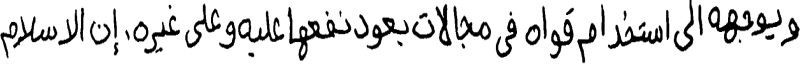

ويوجهه الى استخدام قواه في مجالات يعود نفعها عليه وعلى غيره . إن الاسلام


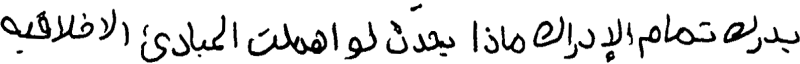

يدرك تمام الإدراك ماذا يحدث لو اهملت المبادئ الاخلاقيه


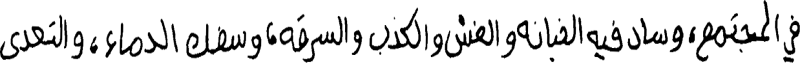

في المجتمع، وساد فيه الخيانه والغش والكذب والسرقه، وسفك الدماء، والتعدى


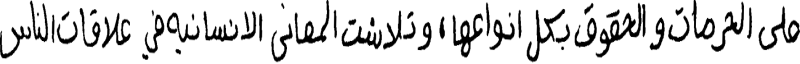

على الحرمات والحقوق بكل انواعها، وتلاشت المعاني الانسانيه في علاقات الناس


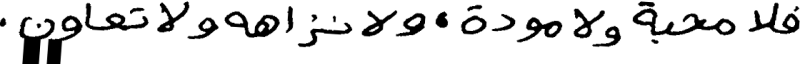

فلا محبة ولا مودة، ولا نزاهه ولا تعاون.


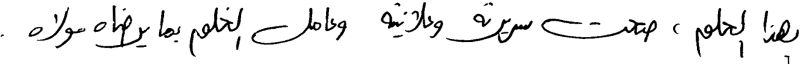

بهذا الخلق ، صحت سريرته وعلانيته ، وعامل الخلق بما يرضاه مولاه  .


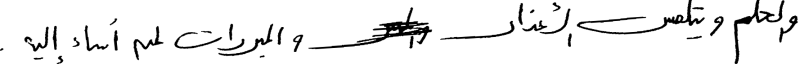

والصبر على الأذى ، فمنهم من يكون سريع الانفعال ويقابل الأذى دون النظر


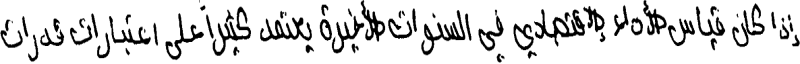

إذا كان قياس الأداء الإقتصادي في السنوات الأخيرة يعتمد كثيراً على اعتبارات قدرات


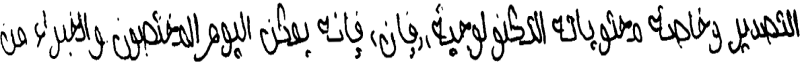

التصدير و خاصة محتوياته التكنولوجية، فإن، فإنه يمكن اليوم المختصون و الخبراء من


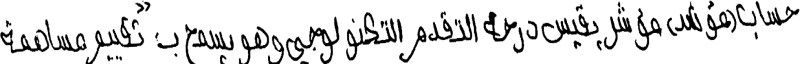

حساب(مؤش) مؤشر يقيس درحة التقدم التكنولوجي و هو يسمح ب"تقييم مساهمة


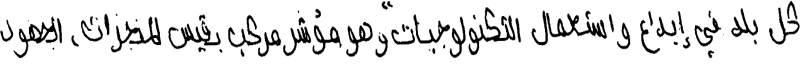

 كل بلد في إبداع و استعمال التكنولوجيات" و هو مؤشر مركب يقيس المنجزات، الجهود


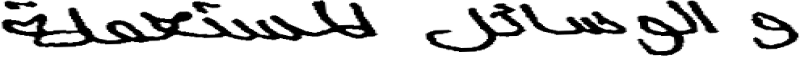

 والوسائل المستعملة


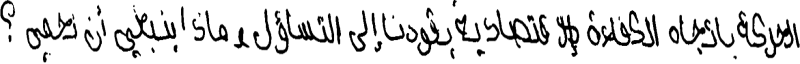

الحركة باتجاه الكفاءة الإقتصادية يقودنا إلى التساؤل، ماذا ينبغي أن نحمي؟


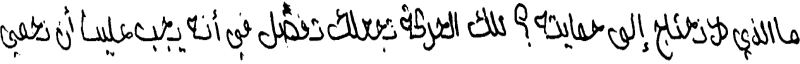

 ما الذي لا نحتاج إلى حمايته؟  تلك الحركة تجعلك تفصل في أنه يجب علينا أن نحمي


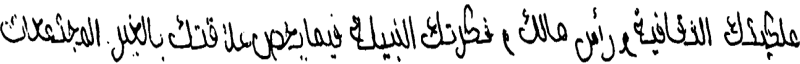

ملكيتك الثقافية، رأس مالك، فكرتك النبيلة  فيما يخص علاقتك بالغير. المجتمعات


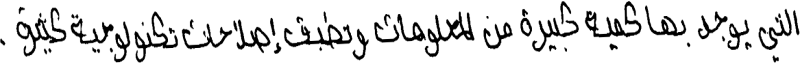

التي يوجد بها كمية كبيرة من المعلومات و تطبق إصلاحات تكنولوجية كثيرة.


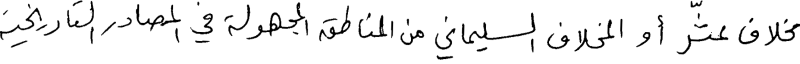

 مخلاف عثّر  أو  المخلاف السليماني من المناطق المجهولة في المصادر التاريخية


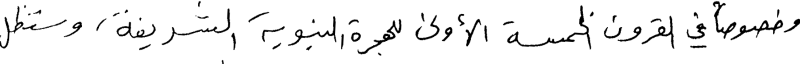

وخصوصاً في القرون الخمسة  الأولى للهجرة النبوية الشريفة، وستظل


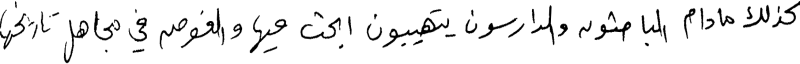

كذلك مادام  الباحثون والدارسون يتهيبون ابحث فيها والغوص في مجاهل تاريخها


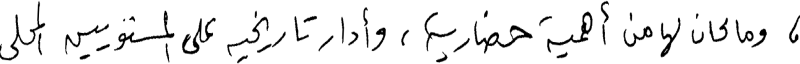

، وما كان لها من  أهمية حضارية ، وأدار تاريخيه على المستويين  المحلي


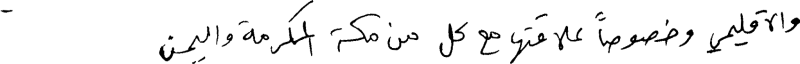

والاقليمي  وخصوصاً علاقتها مع كل  من مكة  المكرمة واليمن


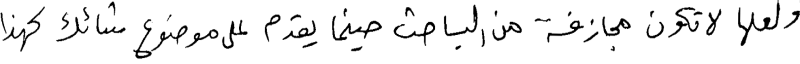

ولعلها  لا تكون مجازفة  من الباحث حينما يقدم  على موضوع شائك  كهذا


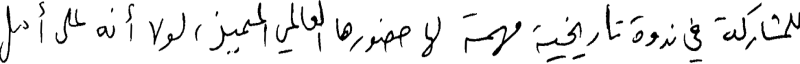

للمشاركة في ندوة تاريخية مهمة  لها حضورها العالمي المميز ، لولا  أنه على أمل


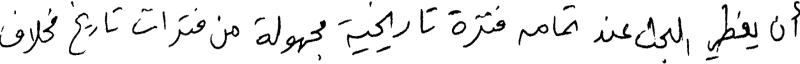

أن يغطي  البحث عند  تمامه فترة تاريخية مجهولة  من فترات تاريخ مخلاف


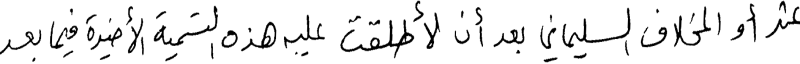

عثر أو المخلاف السليماني بعد أن  لأطلقت  عليه هذه التسمية الأخيرة فيما بعد


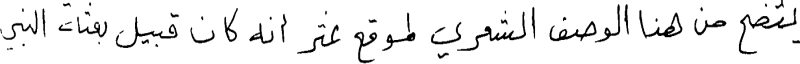

يتضح من هذا الوصف الشعري لموقع عثر  أنه كان قبيل بعثة النبي


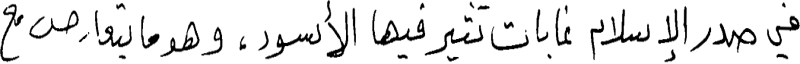

 في صدر الإسلام  غابات تثير فيها  الأسود ، وهو ما يتعارض مع


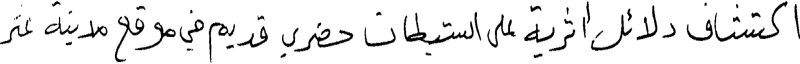

اكتشاف دلائل أثرية على استيطان حضري قديم في موقع مدينة عثر


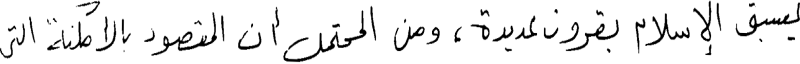

يسبق  الإسلام  بقرون عديدة ، ومن  المحتمل أن المقصود  بالأمكنة التي


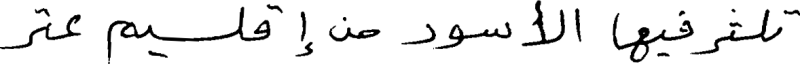

تكثر فيها  الأسود  من إقلـــيم عثر


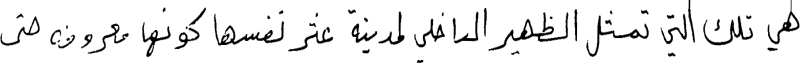

هي تلك التي تمثل  الظهير الىاخلي لمدينة  عثر نفسها كونها معروفه حتى


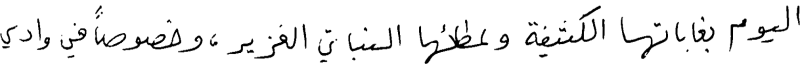

اليوم بغاباتها  الكثيفة  وعطائها  النباتي الغزير ، وخصوصاً في وادي


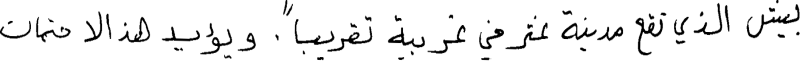

بيش  الذي تقع  مدينة عثر في غربية تقريباً . ويؤيد هذا الاحتمال


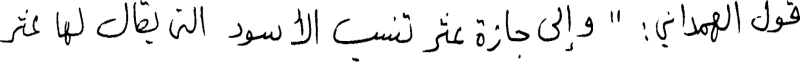

قول الهمداني : " وإلى جازة عثر تنسب الأسود   التي يقال لها  عثر


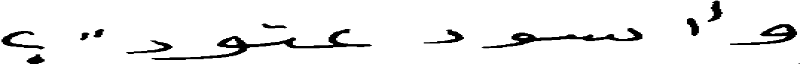

وأسود  عتود" ؟


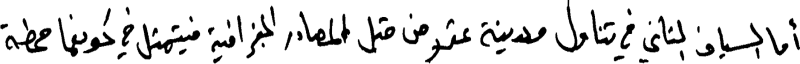

أما السياف الثاني في تناول مدينة عثر من قبل المصادر الجغرافية فيتمثل في كونها محطة


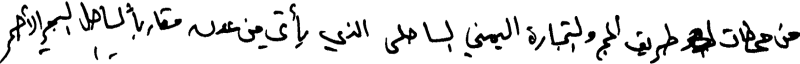

من محطات # طريق الحج والتجارة اليمني الساحلي الذي يأتي من عدن مقارباً لساحل البحر الأحمر


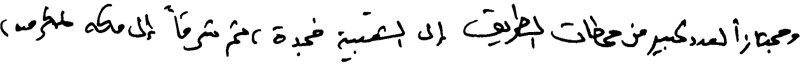

ومجتازاً لعدد كبير من محطات الطريق إلى الشعبية فجدة، ثم شرقاً إلى مكة المكرمة،


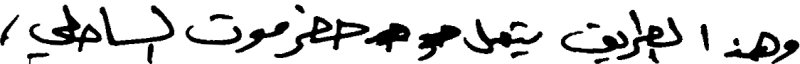

 وهذا الطريق يتصل # # حضرموت الساحلي،


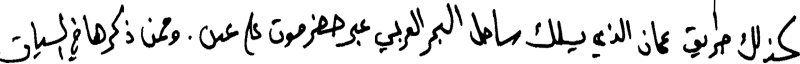

كذلك طريق عمان الذي يسلك ساحل البحر العربي عبر حضرموت على عدن  وممن ذكرها في السياق


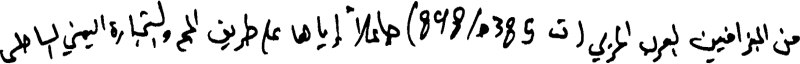

من الجغرافيين العرب الحربي ( ت 385هـ/898) جاعلاً إياها على طريق الحج والتجارة اليمني الساحلي


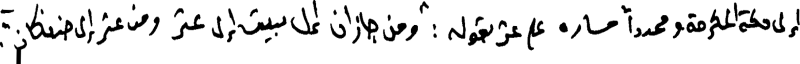

إلى مكة المكرمة، ومحدداً مساره على عثر بقوله :" ومن جازان إلى بيش إلى عثر ومن عثر إلى ضنكان"


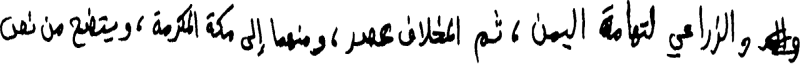

 ،# والزراعي لتهامة اليمن، ثم المخلاف عصر، ومنهما إلى مكة المكرمة، ويتضح من نص


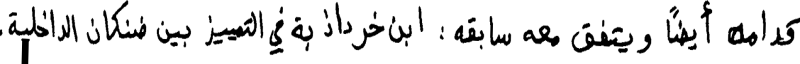

قدامه أيضاً ويتفق معه سابقه: ابن خرداذبة في التمييز بين ضنكان الداخلية .


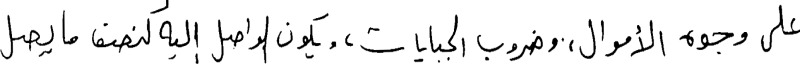

على وجوه  الأموال،.وضروب الجبايات ، ويكون الواصل إليه كنصف  ما يصل


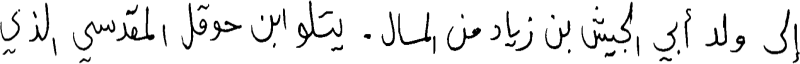

إلى  ولد  أبي الجيش بن  زياد من المال . يتلو ابن حوقل  المقدسي  الذي


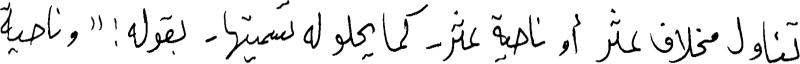

تناول مخلاف عثر  أو ناحية عثر- كما يحلو له تسميتها - بقوله : " وناحية


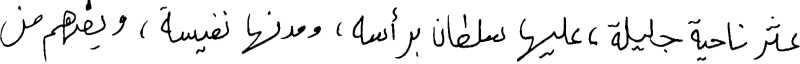

عثر ناحية جليلة ، عليها سلطان برأسه ، ومدنها نفيسة ، ويفهم من


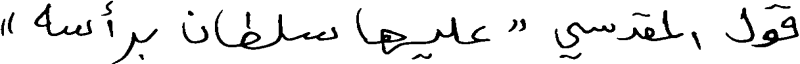

قول  المقدسي " عليها سلطان برأسه "


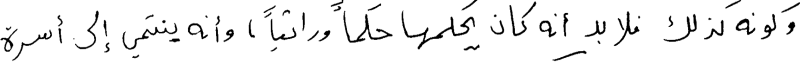

وكونه كذلك   فلا بد  أنه كان  يحكمها حكماً وراثياً ، وأنه ينتمي إلى أسرة


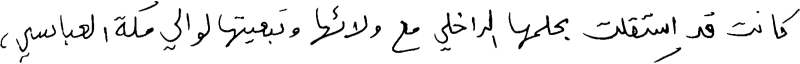

كانت قد استقلت بحكمها الداخلي  مع  ولائها وتبعيتها لوالي مكة العباسي ،


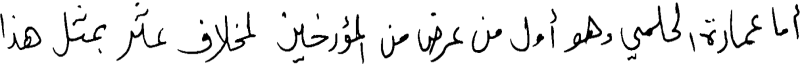

أما عمارة الحكمي وهو أول من عرض من  المؤرخين   لمخلاف عثر بمثل هذا


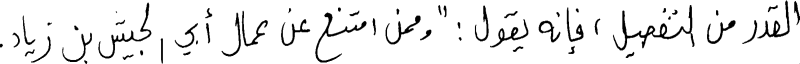

القدر من التفصيل ، فإنه يقول : " وممن امتنع عن  عمال أبي الجيش بن زياد .


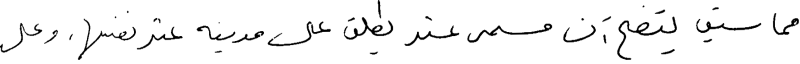

مما سبق  يتضح أن مسمى عثر  يطلق على مدينة عثر نفسها، وعلى


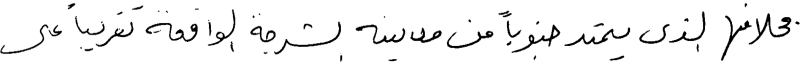

مخلافها  الذى يمتد جنوباً من مدينه الشرجة الواقعة تقريباً على


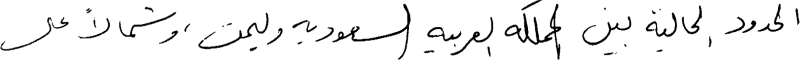

الحدود  الحالية بين  المملكه العربيه السعوديه وليمن ، وشمالاً على


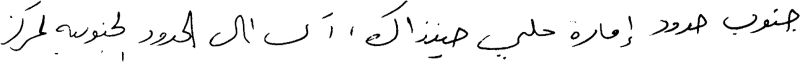

جنوب حدود  إمارة حلي حينذاك ، آى الى الحدود  الجنوبيه لمركز


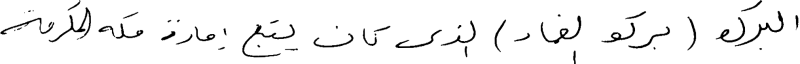

البرك ( برك الغماد ) الذى كان يتبع إمارة  مكة المكرمة


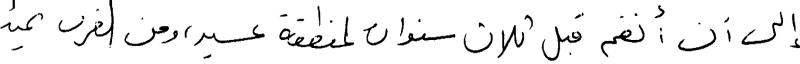

إلى أن أنضم  قبل  ثلاث سنوات لمنطقة عسير، ومن الغرب  يمتد


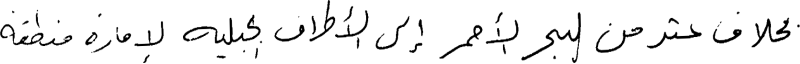

بحلاف عثر من البحر الأحمر  إلى الأطراف الجبليه  لإمارة منطقة


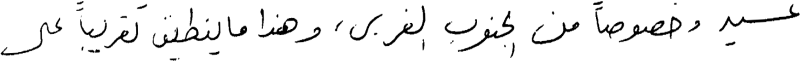

عسير وخصوصاً  من الجنوب الغربى ، وهذا ما ينطبق تقريباُ على


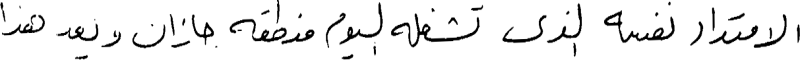

الامتداد  نفسه  الذي  تشغله اليوم منطقه جازان ويعد  هذا


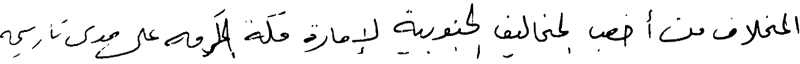

المخلاف من أخصب  المخاليف الجنوبية لإمارة مكة المكرمه على مدى تاريخه


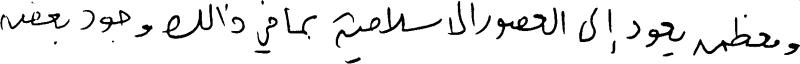

ومعظمه يعود إلى العصور الاسلامية  بما في ذالك وجود بعض


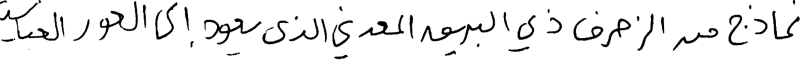

نماذج من الزحرف ذي البريق المعدني الذي يعود  إلى العور العباسية


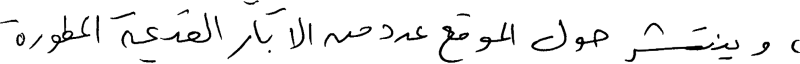

، وينتشر  حول الموقع عدد من الآبار القديمة المطورة


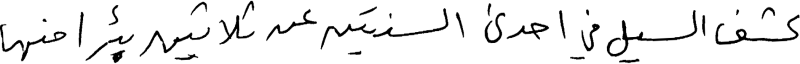

كشف السيل في إحدى  السنتين عن ثلاثين بئرا منها


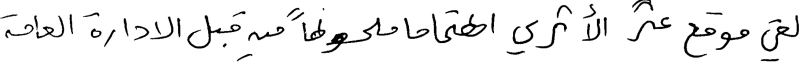

لقي موقع عثر  الأثري  اهتماما ملحوظاً من قبل الادارة العامة


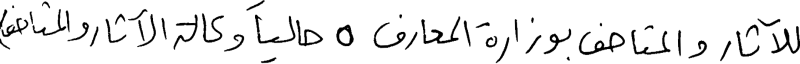

للآثار والمتاحف بوزارة المعارف 5  حالياً وكالة الآثار والمتاحف)


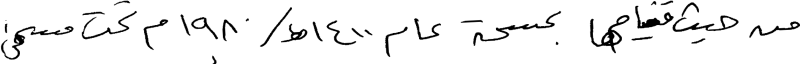

من حيث قيامها  بمسحة  عام 1400هـ/1980م تحت مسمى


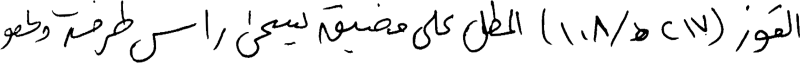

القوز (217هـ/108)  المطل على مضيق يسمى رأس طرفة وهو


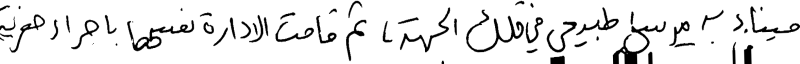

ميناء به مرسى طبيعي في تلك الجهة ،  ثم قامت الادارة نفسها باجراء حفرية


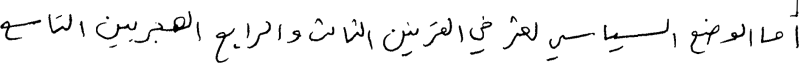

أما الوضع السياسي لعثر في القرنين الثالث والرابع الهجريين التاسع


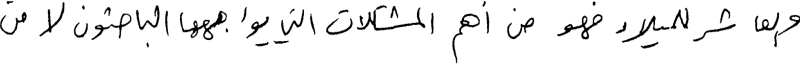

والعاشر للميلاد فهو من أهم المشكلات التي يواجهها الباحثون لا من


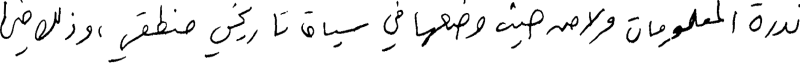

ندرة المعلومات ولا من حيث وضعها في سياق تاريخي منطقي، وذلك فيما


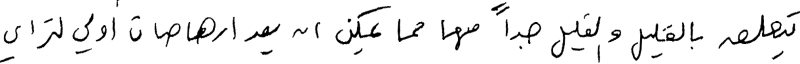

يتعلق بالقليل والقليل جداً منها مما يمكن ان يعد ارهاصات أولي لتراي


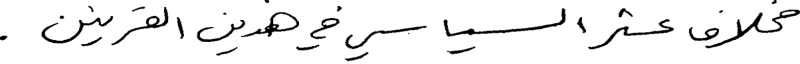

مخلاف عثر السياسي في هذين القرنين.


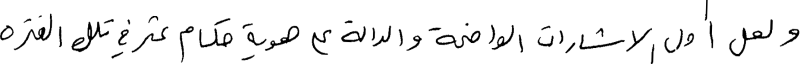

ولعل أول الاشارات الواضحة والدالة على هوية حكام عثر في تلك الفتره


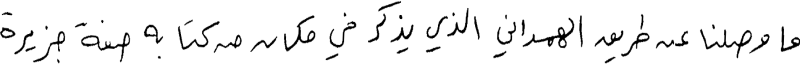

ما وصلنا عن طريق الهمداني الذي يذكر في مكان من كتابه صفة جزيرة


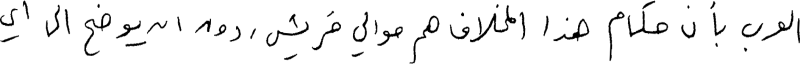

العرب بأن حكام هذا المخلاف هم موالي قريش، دون ان يوضح الى اي


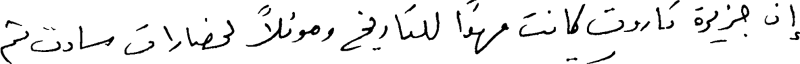

إن جزيرة تاروت كانت مهدأ للتاريخ وموئلأ لحضارات سادت ثم


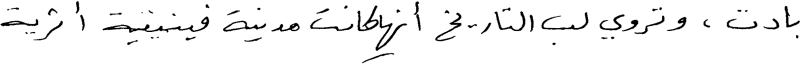

بادت، وتروي كتب التاريخ أنها كانت مدينة فينيقية أثرية


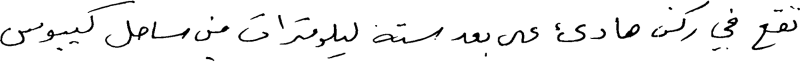

تقع في ركن هادئ على بعد ستة كيلومترات من ساحل كيبوس


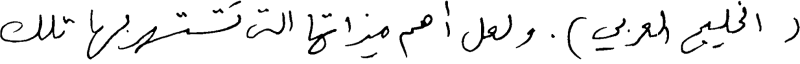

( الخليج العربي). ولعل أهم ميزاتها التي تشتهر بها تلك


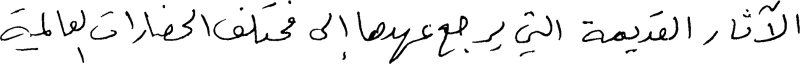

الآثار القديمة التي يرجع عهدها إلى مختلف الحضارات العالمية


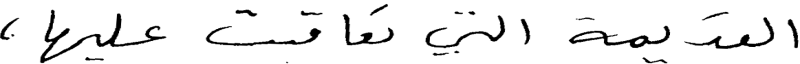

القديمة التي تعاقبت عليها،


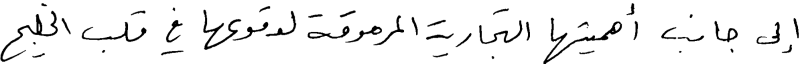

إلى جانب أهميتها التجارية المرموقة لوقوعها في قلب الخليج


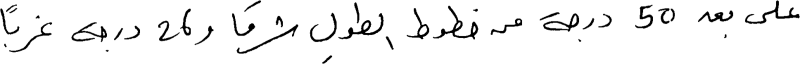

على بعد 50 درجة من خطوط الطول شرقا و 26 درجة غربأ


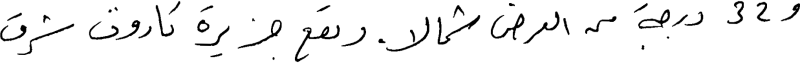

و 32 درجة من العرض شمالا. وتقع جزيرة تاروت شرق


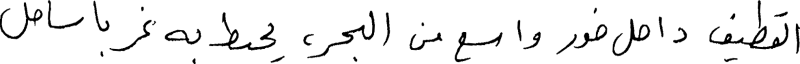

القطيف داخل خور واسع من البحر، يحيط به غربا ساحل


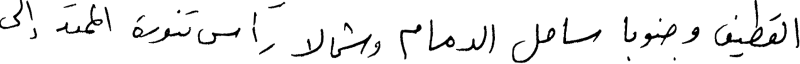

القطيف وجنوبأ ساحل الدمام وشمالا رأس تنورة الممتد إلى


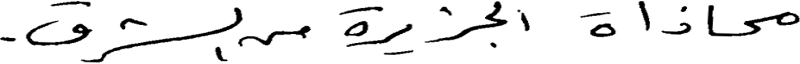

محاذاة الجزيرة من الشرق.


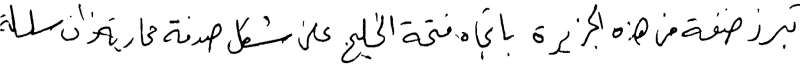

تبرز ضفة من هذه الجزيرة باتجاه فتحة الخليج على شكل صدفة محارية ذات سلسلة


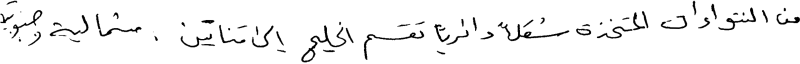

من النتواءات المتخذة شكلأ دائريأ تقسم الخليج إلى قناتين: شمالية وجنوبية


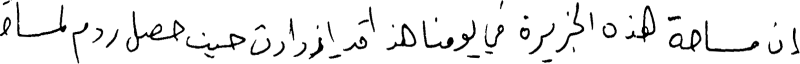

إن مساحة هذه الجزيرة في يومنا هذا قد إزدادت، حيث حصل ردم لمساة


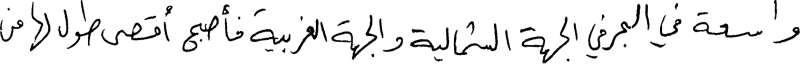

واسعة في البحر في الجهة الشمالية والجهة الغربية فأصبح أقصى طول لها من


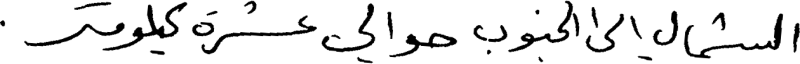

الشمال إلى الجنوب حوالي عشرة كيلومتر.


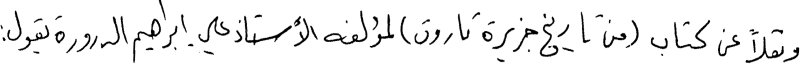

ونقلاً عن كتاب (من تاريخ جزيرة تاروت) لمؤلفه الأستاذ علي إبراهيم الدرورة يقول:


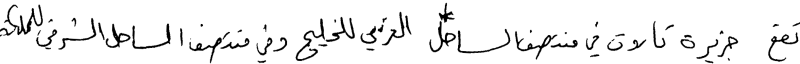

تقع جزيرة تاروت في منتصف الساحل الغربي للخليج وفي منتصف الساحل الشرقي للملكة


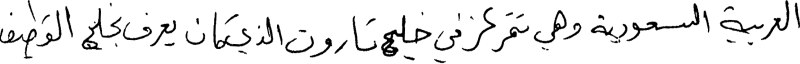

In [ ]:
#Validation folder
for i in range(len(valid_images)):
  cv2_imshow(valid_images[i])
  print(valid_labels[i])

In [ ]:
#Test folder
for i in range(len(test_images)):
  cv2_imshow(test_images[i])
  print(test_labels[i])